---
---
# NER tags analysis


---

In [15]:
import pandas as pd

In [16]:
df = pd.read_csv('sentences_pairs(data).csv')

In [17]:
corpus_sentences = df['sentence'].tolist()
corpus_ai_sentences = df['ai_sentence'].tolist()

print(corpus_sentences[:5])  # Print first 5 sentences for verification
print(corpus_ai_sentences[:5])  # Print first 5 AI sentences for verification

["Error: Invalid URL 'link': No scheme supplied.", 'Perhaps you meant https://link?', 'The map runs to sixteen laminated foolscap pages, or about ten square feet, when I tile the pages together.', 'I have been given it on the condition that I do not pass it on.', 'It is not like any map I have ever seen, and I have seen some strange maps in my time.']
["Alert: The specified URL 'link' is invalid due to absence of a scheme (http(s)://).", 'It is possible that the intended link is: <https://link>', 'The assemblage of the sixteen laminated foolscap pages spans approximately ten square feet when joined.', "I've received it under the proviso of non-dissemination.", "This map does not resemble any I've encountered previously, as I've had exposure to some unconventionally designed maps during my tenure."]


In [149]:
import spacy
import pandas as pd

# Load English language model with NER support
nlp = spacy.load('en_core_web_sm')

def get_ner_tags(text):
    doc = nlp(str(text))
    return [(ent.text, ent.label_) for ent in doc.ents]

# Get NER tags for both human and AI sentences
human_ner = df['sentence'].head(10).apply(get_ner_tags)
ai_ner = df['ai_sentence'].head(10).apply(get_ner_tags)

# Create comparison dataframe
ner_comparison = pd.DataFrame({
    'Original Text': df['sentence'].head(10),
    'Human NER': human_ner,
    'AI Text': df['ai_sentence'].head(10),
    'AI NER': ai_ner
})

print("Named Entity Recognition Comparison:")
print("-" * 80)
for idx, row in ner_comparison.iterrows():
    print(f"\nSentence {idx+1}:")
    print(f"Original: {row['Original Text']}")
    print(f"Human NER: {row['Human NER']}")
    print(f"AI: {row['AI Text']}")
    print(f"AI NER: {row['AI NER']}")
    print("-" * 80)

Named Entity Recognition Comparison:
--------------------------------------------------------------------------------

Sentence 1:
Original: Error: Invalid URL 'link': No scheme supplied.
Human NER: []
AI: Alert: The specified URL 'link' is invalid due to absence of a scheme (http(s)://).
AI NER: []
--------------------------------------------------------------------------------

Sentence 2:
Original: Perhaps you meant https://link?
Human NER: [('https://link', 'PERSON')]
AI: It is possible that the intended link is: <https://link>
AI NER: []
--------------------------------------------------------------------------------

Sentence 3:
Original: The map runs to sixteen laminated foolscap pages, or about ten square feet, when I tile the pages together.
Human NER: [('sixteen', 'CARDINAL'), ('about ten square feet', 'QUANTITY')]
AI: The assemblage of the sixteen laminated foolscap pages spans approximately ten square feet when joined.
AI NER: [('sixteen', 'DATE'), ('approximately ten squar

## so needed to Identify what was missing in NER afterwards

In [152]:
# Get NER differences between human and AI sentences

differences = []
for idx, row in ner_comparison.iterrows():
    human_ner = set(tuple(x) for x in row['Human NER'])  # Convert to set of tuples for comparison
    ai_ner = set(tuple(x) for x in row['AI NER'])
    
    if human_ner != ai_ner:
        differences.append({
            'Index': idx,
            'Original Text': row['Original Text'],
            'AI Text': row['AI Text'],
            'Human NER': row['Human NER'],
            'AI NER': row['AI NER'],
            'Added': [x for x in ai_ner if x not in human_ner],
            'Removed': [x for x in human_ner if x not in ai_ner]
        })

# Print the differences
for diff in differences:
    print(f"\nIndex: {diff['Index']}")
    print("-" * 80)
    print(f"Original: {diff['Original Text'][:100]}...")
    print(f"Human NER: {diff['Human NER']}")
    print(f"AI: {diff['AI Text'][:100]}...")
    print(f"AI NER: {diff['AI NER']}")
    print(f"Added entities: {diff['Added']}")
    print(f"Removed entities: {diff['Removed']}")



Index: 1
--------------------------------------------------------------------------------
Original: Perhaps you meant https://link?...
Human NER: [('https://link', 'PERSON')]
AI: It is possible that the intended link is: <https://link>...
AI NER: []
Added entities: []
Removed entities: [('https://link', 'PERSON')]

Index: 2
--------------------------------------------------------------------------------
Original: The map runs to sixteen laminated foolscap pages, or about ten square feet, when I tile the pages to...
Human NER: [('sixteen', 'CARDINAL'), ('about ten square feet', 'QUANTITY')]
AI: The assemblage of the sixteen laminated foolscap pages spans approximately ten square feet when join...
AI NER: [('sixteen', 'DATE'), ('approximately ten square feet', 'QUANTITY')]
Added entities: [('approximately ten square feet', 'QUANTITY'), ('sixteen', 'DATE')]
Removed entities: [('about ten square feet', 'QUANTITY'), ('sixteen', 'CARDINAL')]

Index: 8
---------------------------------------

## Identify missing NERs much , so lets get some stat

In [153]:
# Get NER differences for all sentences
all_differences = []
for idx, row in df.iterrows():
    # Get NER for human and AI sentences
    human_ner = get_ner_tags(row['sentence'])
    ai_ner = get_ner_tags(row['ai_sentence'])
    
    # Convert to sets for comparison
    human_ner_set = set(tuple(x) for x in human_ner) 
    ai_ner_set = set(tuple(x) for x in ai_ner)
    
    # Identify missed entities
    missed_entities = human_ner_set - ai_ner_set
    
    # Add to differences if entities were missed
    if missed_entities:
        all_differences.append({
            'sentence_id': idx,
            'original_text': row['sentence'],
            'ai_text': row['ai_sentence'], 
            'missed_entities': list(missed_entities)
        })

# Create summary statistics
total_sentences = len(df)
sentences_with_missed_ner = len(all_differences)
missed_ratio = sentences_with_missed_ner / total_sentences * 100

# Print stats and sample of missed entities
print(f"Total sentences analyzed: {total_sentences}")
print(f"Sentences with missed NER entities: {sentences_with_missed_ner}")
print(f"Percentage of sentences with missed NER: {missed_ratio:.2f}%\n")

print("Sample of sentences with missed entities:")
print("-" * 80)
for diff in all_differences[:5]:
    print(f"\nSentence {diff['sentence_id']}:")
    print(f"Original: {diff['original_text'][:100]}...")
    print(f"Missed entities: {diff['missed_entities']}")

Total sentences analyzed: 2548
Sentences with missed NER entities: 926
Percentage of sentences with missed NER: 36.34%

Sample of sentences with missed entities:
--------------------------------------------------------------------------------

Sentence 1:
Original: Perhaps you meant https://link?...
Missed entities: [('https://link', 'PERSON')]

Sentence 2:
Original: The map runs to sixteen laminated foolscap pages, or about ten square feet, when I tile the pages to...
Missed entities: [('about ten square feet', 'QUANTITY'), ('sixteen', 'CARDINAL')]

Sentence 10:
Original: At junctions, three or four tunnel-streets might spray out....
Missed entities: [('four', 'CARDINAL'), ('three', 'CARDINAL')]

Sentence 13:
Original: Coming off some of the tunnels are chambers, irregular in their outlines and with dozens of small co...
Missed entities: [('dozens', 'CARDINAL')]

Sentence 16:
Original: The Boutique of Psychosis....
Missed entities: [('The Boutique of Psychosis', 'ORG')]


---
---
# Sentiment Analysis of Human vs AI Generated Text Pairs
---



In [19]:
import nltk
from nltk import pos_tag
from nltk.tokenize import word_tokenize

nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')

# Function to get POS tags for a sentence
def get_pos_tags(sentence):
    tokens = word_tokenize(sentence)
    pos_tags = pos_tag(tokens)
    return ' '.join([f"{word}/{tag}" for word, tag in pos_tags])

# Create a new DataFrame for POS tagged sentences
pos_sentences = df[['sentence', 'ai_sentence']].copy()

# Apply POS tagging to both 'sentence' and 'ai_sentence' columns
pos_sentences['sentence_pos'] = pos_sentences['sentence'].apply(get_pos_tags)
pos_sentences['ai_sentence_pos'] = pos_sentences['ai_sentence'].apply(get_pos_tags)

# Display the updated DataFrame
print(pos_sentences.head())

[nltk_data] Downloading package punkt to /home/kasr_ubu/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /home/kasr_ubu/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


                                            sentence  \
0                    Perhaps you meant https://link?   
1  The map runs to sixteen laminated foolscap pag...   
2  I have been given it on the condition that I d...   
3  It is not like any map I have ever seen, and I...   
4  The plan of the above-ground city is traced ca...   

                                         ai_sentence  \
0  It is possible that the intended link is: <htt...   
1  The assemblage of the sixteen laminated foolsc...   
2  I've received it under the proviso of non-diss...   
3  This map does not resemble any I've encountere...   
4  The design of the above-ground metropolis is d...   

                                        sentence_pos  \
0  Perhaps/RB you/PRP meant/VBP https/NNS :/: //l...   
1  The/DT map/NN runs/VBZ to/TO sixteen/VB lamina...   
2  I/PRP have/VBP been/VBN given/VBN it/PRP on/IN...   
3  It/PRP is/VBZ not/RB like/IN any/DT map/NN I/P...   
4  The/DT plan/NN of/IN the/DT above-ground/JJ

In [20]:
import pandas as pd
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer


In [21]:
def get_sentiment_scores(sentence):
    scores = analyzer.polarity_scores(sentence)
    return scores['neg'], scores['neu'], scores['pos'], scores['compound']


In [22]:
# Initialize SentimentIntensityAnalyzer
analyzer = SentimentIntensityAnalyzer()

# Create a new DataFrame to store sentiment scores
df_sent = pd.DataFrame()

# Apply sentiment analysis to 'sentence' column
df_sent[['human_neg', 'human_neu', 'human_pos', 'human_compound']] = df['sentence'].apply(
    lambda x: pd.Series(get_sentiment_scores(str(x)))
)

# Apply sentiment analysis to 'ai_sentence' column
df_sent[['ai_neg', 'ai_neu', 'ai_pos', 'ai_compound']] = df['ai_sentence'].apply(
    lambda x: pd.Series(get_sentiment_scores(str(x)))
)
print(df_sent.head())

   human_neg  human_neu  human_pos  human_compound  ai_neg  ai_neu  ai_pos  \
0      0.000      1.000      0.000          0.0000     0.0   1.000   0.000   
1      0.000      1.000      0.000          0.0000     0.0   1.000   0.000   
2      0.000      1.000      0.000          0.0000     0.0   1.000   0.000   
3      0.178      0.822      0.000         -0.4423     0.0   1.000   0.000   
4      0.033      0.912      0.054          0.0516     0.0   0.964   0.036   

   ai_compound  
0         0.00  
1         0.00  
2         0.00  
3         0.00  
4         0.25  


Let's see if there a significant difference or not..?

In [23]:
df_sent['compound_diff'] = df_sent['human_compound'] - df_sent['ai_compound']
df_sent['neg_diff'] = df_sent['human_neg'] - df_sent['ai_neg']
df_sent['neu_diff'] = df_sent['human_neu'] - df_sent['ai_neu']
df_sent['pos_diff'] = df_sent['human_pos'] - df_sent['ai_pos']

In [24]:
df_sent.head()

,human_neg,human_neu,human_pos,human_compound,ai_neg,ai_neu,ai_pos,ai_compound,compound_diff,neg_diff,neu_diff,pos_diff
0,0.000,1.000,0.000,0.0000,0.0,1.000,0.000,0.00,0.0000,0.000,0.000,0.000
1,0.000,1.000,0.000,0.0000,0.0,1.000,0.000,0.00,0.0000,0.000,0.000,0.000
2,0.000,1.000,0.000,0.0000,0.0,1.000,0.000,0.00,0.0000,0.000,0.000,0.000
3,0.178,0.822,0.000,-0.4423,0.0,1.000,0.000,0.00,-0.4423,0.178,-0.178,0.000
4,0.033,0.912,0.054,0.0516,0.0,0.964,0.036,0.25,-0.1984,0.033,-0.052,0.018


In [25]:

# Function to get sentiment label based on compound difference
def get_sentiment_label(compound_diff):
    if compound_diff > 0:
        return 'positive'
    elif compound_diff < 0:
        return 'negative'
    else:
        return 'neutral'
 # Apply the function to create a new column 'sentiment_label'   
df_sent['sentiment_label'] = df_sent['compound_diff'].apply(get_sentiment_label)
print(df_sent.head())

   human_neg  human_neu  human_pos  human_compound  ai_neg  ai_neu  ai_pos  \
0      0.000      1.000      0.000          0.0000     0.0   1.000   0.000   
1      0.000      1.000      0.000          0.0000     0.0   1.000   0.000   
2      0.000      1.000      0.000          0.0000     0.0   1.000   0.000   
3      0.178      0.822      0.000         -0.4423     0.0   1.000   0.000   
4      0.033      0.912      0.054          0.0516     0.0   0.964   0.036   

   ai_compound  compound_diff  neg_diff  neu_diff  pos_diff sentiment_label  
0         0.00         0.0000     0.000     0.000     0.000         neutral  
1         0.00         0.0000     0.000     0.000     0.000         neutral  
2         0.00         0.0000     0.000     0.000     0.000         neutral  
3         0.00        -0.4423     0.178    -0.178     0.000        negative  
4         0.25        -0.1984     0.033    -0.052     0.018        negative  


/tmp/ipykernel_69678/3823314967.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='sentiment_label', data=df_sent, palette='viridis')


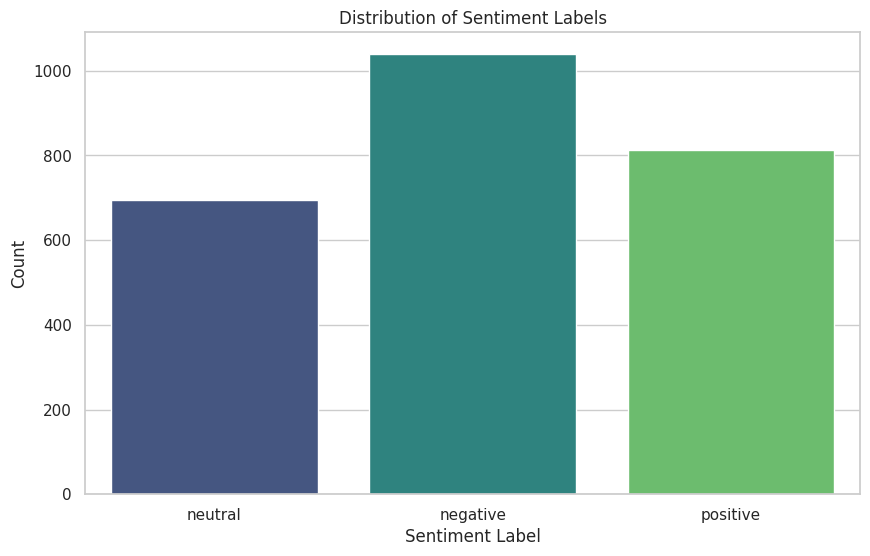

In [26]:
import seaborn as sns

import matplotlib.pyplot as plt

# Set the style of the visualization
sns.set(style="whitegrid")

# Create a count plot for sentiment labels
plt.figure(figsize=(10, 6))
sns.countplot(x='sentiment_label', data=df_sent, palette='viridis')
plt.title('Distribution of Sentiment Labels')
plt.xlabel('Sentiment Label')
plt.ylabel('Count')
plt.show()

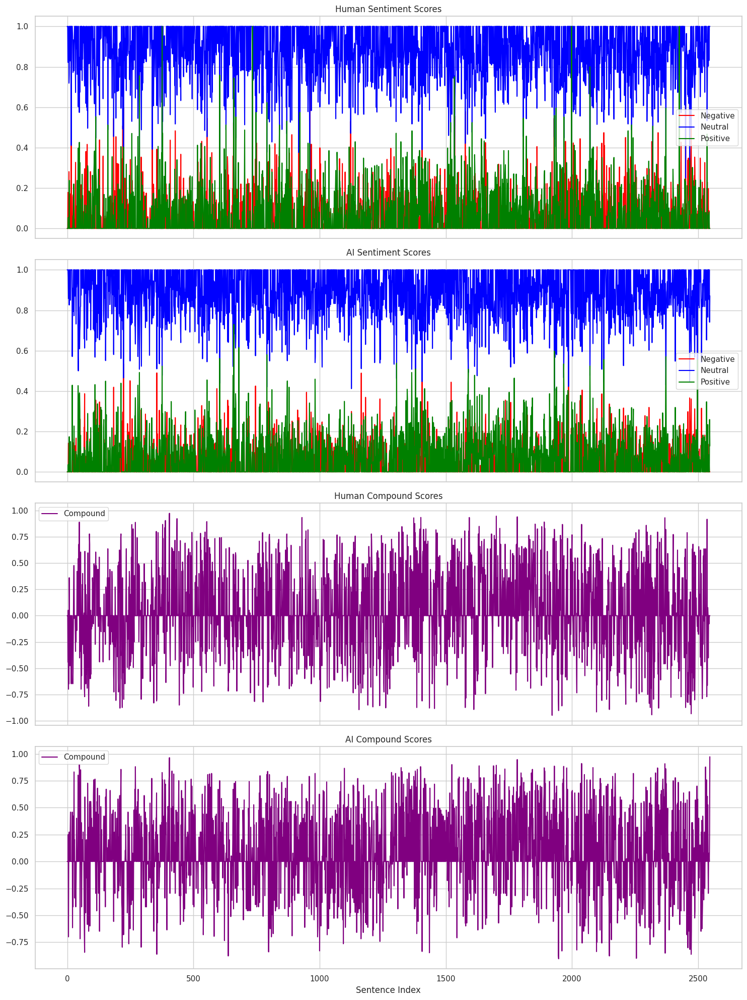

In [27]:
import matplotlib.pyplot as plt

# Create subplots
fig, axes = plt.subplots(nrows=4, ncols=1, figsize=(15, 20), sharex=True)

# Plot human sentiment scores
axes[0].plot(df_sent.index, df_sent['human_neg'], label='Negative', color='red')
axes[0].plot(df_sent.index, df_sent['human_neu'], label='Neutral', color='blue')
axes[0].plot(df_sent.index, df_sent['human_pos'], label='Positive', color='green')
axes[0].set_title('Human Sentiment Scores')
axes[0].legend()

# Plot AI sentiment scores
axes[1].plot(df_sent.index, df_sent['ai_neg'], label='Negative', color='red')
axes[1].plot(df_sent.index, df_sent['ai_neu'], label='Neutral', color='blue')
axes[1].plot(df_sent.index, df_sent['ai_pos'], label='Positive', color='green')
axes[1].set_title('AI Sentiment Scores')
axes[1].legend()

# Plot human compound scores
axes[2].plot(df_sent.index, df_sent['human_compound'], label='Compound', color='purple')
axes[2].set_title('Human Compound Scores')
axes[2].legend()

# Plot AI compound scores
axes[3].plot(df_sent.index, df_sent['ai_compound'], label='Compound', color='purple')
axes[3].set_title('AI Compound Scores')
axes[3].legend()

# Set common labels
plt.xlabel('Sentence Index')
plt.tight_layout()
plt.show()

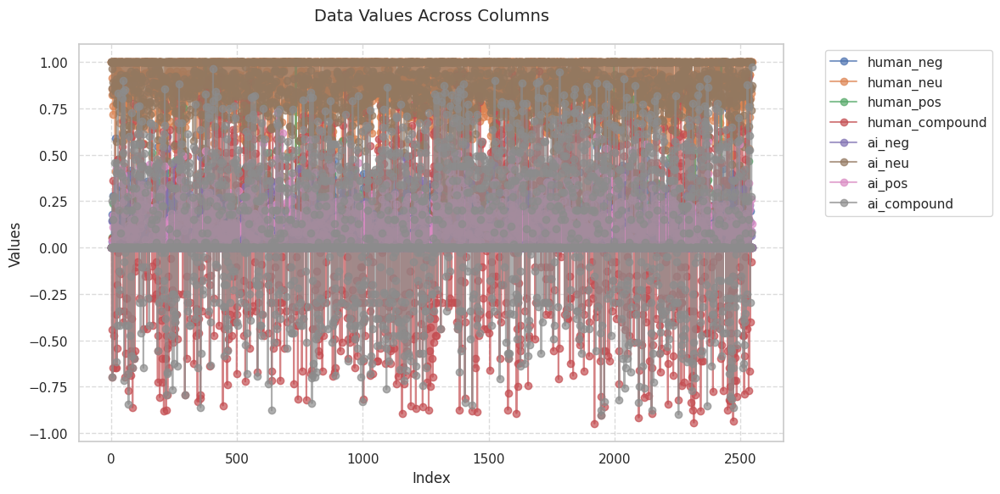

In [ ]:
#use plotly for better visualization
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# Use the sentiment columns from df_sent
df = df_sent[['human_neg', 'human_neu', 'human_pos', 'human_compound', 'ai_neg', 'ai_neu', 'ai_pos', 'ai_compound']]

# Create a Plotly figure
fig = px.line(df, x=df.index, y=df.columns, markers=True, title='Data Values Across Columns')

# Customize the layout
fig.update_layout(
    xaxis_title='Index',
    yaxis_title='Values',
    legend_title='Columns',
    template='plotly_white'
)

# Show the figure
fig.show()
# Create a new DataFrame for POS tagged sentences, subset of the original DataFrame with figure size 12x6
fig, ax = plt.subplots(figsize=(12, 6))

# Plot each column
for column in df.columns:
    plt.plot(df.index, df[column], label=column, marker='o', alpha=0.7)

# Customize plot
plt.title('Data Values Across Columns', fontsize=14, pad=20)
plt.xlabel('Index', fontsize=12)
plt.ylabel('Values', fontsize=12)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.7)

# Adjust layout and display
plt.tight_layout()
plt.show()

In [ ]:
# Filter the DataFrame to include only the first 100 records

import plotly.express as px

# Create a Plotly figure for the first 100 records with the paramters x, y, and markers
fig = px.line(df_sent.head(100), x=df_sent.head(100).index, y=['human_neg', 'ai_neg'], markers=True, title='Sentiment Scores for First 100 Records')

# Customize the layout
fig.update_layout(
    xaxis_title='Index',
    yaxis_title='Sentiment Scores',
    legend_title='Sentiment Type',
    template='plotly_white'
)

# Show the figure
fig.show()

df_sent_100 = df_sent.head(100)



In [30]:
import plotly.express as px

# Create a Plotly figure for the first 100 records
fig = px.line(df_sent.head(100), x=df_sent.head(100).index, y=['human_neu', 'ai_neu'], markers=True, title='Sentiment Scores for First 100 Records')

# Customize the layout
fig.update_layout(
    xaxis_title='Index',
    yaxis_title='Sentiment Scores',
    legend_title='Sentiment Type',
    template='plotly_white'
)

# Show the figure
fig.show()

df_sent_100 = df_sent.head(100)


In [ ]:
# Filter the DataFrame to include only the first 100 records

import plotly.express as px

# Create a Plotly figure for the first 100 records
# Define custom colors for the lines
custom_colors = {
    'human_pos': '#1f77b4',  
    'ai_pos': '#ff7f0e',     
    'human_neu': '#2ca02c',  
    'ai_neu': '#d62728',     
    'human_neg': '#9467bd',  
    'ai_neg': '#8c564b'      
}

# Apply custom colors to the figure

fig = px.line(df_sent.head(300), x=df_sent.head(300).index, y=['human_pos', 'ai_pos', 'human_neu', 'ai_neu', 'human_neg', 'ai_neg'], markers=True, title='Sentiment Scores for First 100 Records')



# Customize the layout
fig.update_layout_images(
    xaxis_title='Index',
    yaxis_title='Sentiment Scores',
    legend_title='Sentiment Type',
    template= "MemoryError"
)

# Show the figure
fig.show()

df_sent_100 = df_sent.head(100)



In [32]:
print(df_sent_100.head())

   human_neg  human_neu  human_pos  human_compound  ai_neg  ai_neu  ai_pos  \
0      0.000      1.000      0.000          0.0000     0.0   1.000   0.000   
1      0.000      1.000      0.000          0.0000     0.0   1.000   0.000   
2      0.000      1.000      0.000          0.0000     0.0   1.000   0.000   
3      0.178      0.822      0.000         -0.4423     0.0   1.000   0.000   
4      0.033      0.912      0.054          0.0516     0.0   0.964   0.036   

   ai_compound  compound_diff  neg_diff  neu_diff  pos_diff sentiment_label  
0         0.00         0.0000     0.000     0.000     0.000         neutral  
1         0.00         0.0000     0.000     0.000     0.000         neutral  
2         0.00         0.0000     0.000     0.000     0.000         neutral  
3         0.00        -0.4423     0.178    -0.178     0.000        negative  
4         0.25        -0.1984     0.033    -0.052     0.018        negative  


In [148]:
# Filter the DataFrame to include only the first 100 records

import plotly.express as px

# Create a Plotly figure for the first 100 records
# Define custom colors for the lines
custom_colors = {
    'human_pos': '#1f77b4',  # blue
    'ai_pos': '#ff7f0e',     # orange
    'human_neu': '#2ca02c',  # green
    'ai_neu': '#d62728',     # red
    'human_neg': '#9467bd',  # purple
    'ai_neg': '#8c564b'      # brown
}

# Create a Plotly figure for the first 100 records
fig = px.line(df_sent.head(100), x=df_sent.head(100).index, y=['neg_diff', 'neu_diff', 'pos_diff'], markers=True, title='Sentiment Differences for First 100 Records')

fig.update_yaxes(range=[-1, 1])
# Customize the layout
fig.update_layout(
    xaxis_title='Index',
    yaxis_title='Sentiment Scores',
    legend_title='Sentiment Type',
    template='plotly_white'
)

# Show the figure
fig.show()

df_sent_100 = df_sent.head(14)



## As this plot shows , there is a significance snetiment changes happened when the same sentence writtent form the AI . that which should not be happened . Untill the writer Attepts to enhance feelings


# Le's analyse before and after the humanizer 


In [34]:
original_text = """

The map runs to sixteen laminated foolscap pages, or about ten square feet, when I tile the pages together.
I have been given it on the condition that I do not pass it on.
It is not like any map I have ever seen, and I have seen some strange maps in my time.
The plan of the above-ground city is traced carefully in pale silver-gray ink, such that, if you read only for the gray, you can discern the faint footprints of apartment blocks and embassies, parks and ornamental gardens, boulevards and streets, the churches, the railway lines and the train stations, all hovering there, intricate and immaterial.
The mapâ€™s real contentâ€”the topography it inks in black and blue and orange and redâ€”is the invisible city, the realm out of which, over centuries, the upper city has been hewn and drawn, block by block.
This invisible city follows different laws of planning to its surface counterpart.
Its tunnelled streets often kink and wriggle, or run to dead ends.
Some of them curl back on themselves like whips.
At junctions, three or four tunnel-streets might spray out.
There are slender highways running almost the length of the tiled map, from southwest to northeast.
 """

humanized_text = """ 
The assemblage of the sixteen laminated foolscap pages spans around ten solid feet when joined.
I've sent it under the proviso of non-dissemination.
This map does not resemble any I've encountered recently, as I've had exposure to some unconventionally constructed maps during my tenure.
The pattern of the above-ground city is finely outlined in a subtle silver-black hue, letting one to find the vague outlines of residential complexes and diplomatic structures, recreational spaces and decorative gardens, streets and pathways, religious buildings, subway systems, and transport hubs; all these complex components are visible yet intangible, appearing as a detailed pattern.
The invisible city, from where, over time, the upper city has been meticulously chiseled and digitized, block by block, represents the actual data depicted on the map in various colours such as gray, blue, orange, and red.
The unseen urban entity abides by distinct rules of architectural hierarchy unlike its overt, terrestrial counterpart.
The intricate web of its tunnels often folds and bends, or led to cul-de-sac.
Certain entities demonstrate a looping behavior, resembling the coiling of whips.
At intersections, it may project multiple tunnel-roads.
On the tiled map, there exist narrow roads, mostly extending from southwest to North.
In these areas, there exist inscrutable road networks which seem fractured, or intersections serve as junctions for divergent subterranean paths.


"""

In [35]:
import nltk
from nltk.tokenize import sent_tokenize

nltk.download('punkt')

# Tokenize the texts into sentences
original_sentences = sent_tokenize(original_text)
humanized_sentences = sent_tokenize(humanized_text)

# Analyze sentiment for each sentence in the original text
original_sentiments = [analyzer.polarity_scores(sentence) for sentence in original_sentences]
print("Original Text Sentiments:")
for i, sentiment in enumerate(original_sentiments):
    print(f"Sentence {i+1}: {sentiment}")

# Analyze sentiment for each sentence in the humanized text
humanized_sentiments = [analyzer.polarity_scores(sentence) for sentence in humanized_sentences]
print("\nHumanized Text Sentiments:")
for i, sentiment in enumerate(humanized_sentiments):
    print(f"Sentence {i+1}: {sentiment}")



Original Text Sentiments:
Sentence 1: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Sentence 2: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Sentence 3: {'neg': 0.178, 'neu': 0.822, 'pos': 0.0, 'compound': -0.4423}
Sentence 4: {'neg': 0.033, 'neu': 0.912, 'pos': 0.054, 'compound': 0.0516}
Sentence 5: {'neg': 0.139, 'neu': 0.861, 'pos': 0.0, 'compound': -0.7003}
Sentence 6: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Sentence 7: {'neg': 0.281, 'neu': 0.719, 'pos': 0.0, 'compound': -0.6486}
Sentence 8: {'neg': 0.0, 'neu': 0.762, 'pos': 0.238, 'compound': 0.3612}
Sentence 9: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Sentence 10: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}

Humanized Text Sentiments:
Sentence 1: {'neg': 0.0, 'neu': 0.897, 'pos': 0.103, 'compound': 0.1531}
Sentence 2: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Sentence 3: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Sentence 4: {'neg': 0.025, 'neu': 0.975,

[nltk_data] Downloading package punkt to /home/kasr_ubu/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [36]:
import plotly.graph_objs as go

# Create a Plotly figure for the original text sentiments
fig_original = go.Figure()

# Add traces for each sentiment component in the original text
fig_original.add_trace(go.Scatter(x=list(range(len(original_sentiments))), y=[s['neg'] for s in original_sentiments], mode='lines+markers', name='Original Negative'))
fig_original.add_trace(go.Scatter(x=list(range(len(original_sentiments))), y=[s['neu'] for s in original_sentiments], mode='lines+markers', name='Original Neutral'))
fig_original.add_trace(go.Scatter(x=list(range(len(original_sentiments))), y=[s['pos'] for s in original_sentiments], mode='lines+markers', name='Original Positive'))


# Customize the layout
fig_original.update_layout(
    title='Sentiment Analysis of Original Text',
    xaxis_title='Sentence Index',
    yaxis_title='Sentiment Score',
    legend_title='Sentiment Type',
    template='plotly_white'
)

# Show the figure
fig_original.show()

# Create a Plotly figure for the humanized text sentiments
fig_humanized = go.Figure()

# Add traces for each sentiment component in the humanized text
fig_humanized.add_trace(go.Scatter(x=list(range(len(humanized_sentiments))), y=[s['neg'] for s in humanized_sentiments], mode='lines+markers', name='Humanized Negative'))
fig_humanized.add_trace(go.Scatter(x=list(range(len(humanized_sentiments))), y=[s['neu'] for s in humanized_sentiments], mode='lines+markers', name='Humanized Neutral'))
fig_humanized.add_trace(go.Scatter(x=list(range(len(humanized_sentiments))), y=[s['pos'] for s in humanized_sentiments], mode='lines+markers', name='Humanized Positive'))


# Customize the layout
fig_humanized.update_layout(
    title='Sentiment Analysis of Humanized Text',
    xaxis_title='Sentence Index',
    yaxis_title='Sentiment Score',
    legend_title='Sentiment Type',
    template='plotly_white'
)

# Show the figure
fig_humanized.show()

In [37]:
import pandas as pd

import plotly.express as px

# Create a DataFrame to store the sentiment differences
sentiment_diff = pd.DataFrame({
    'sentence_index': list(range(len(original_sentiments))),
    'neg_diff': [orig['neg'] - hum['neg'] for orig, hum in zip(original_sentiments, humanized_sentiments)],
    'neu_diff': [orig['neu'] - hum['neu'] for orig, hum in zip(original_sentiments, humanized_sentiments)],
    'pos_diff': [orig['pos'] - hum['pos'] for orig, hum in zip(original_sentiments, humanized_sentiments)],
    'compound_diff': [orig['compound'] - hum['compound'] for orig, hum in zip(original_sentiments, humanized_sentiments)]
})

# Plot the sentiment differences using Plotly
fig_diff = px.line(sentiment_diff, x='sentence_index', y=['neg_diff', 'neu_diff', 'pos_diff' ], markers=True, title='Sentiment Differences Between Original and Humanized Texts')
fig_diff.update_yaxes(range=[-1, 1])
# Customize the layout
fig_diff.update_layout(
    xaxis_title='Sentence Index',
    yaxis_title='Sentiment Difference',
    legend_title='Sentiment Type',
    template='plotly_white'
)

# Show the figure
fig_diff.show()

## the setniment differences were minimzer by little bit

In [38]:
# Ensure that original_text and humanized_text are defined
if 'original_text' in globals() and 'humanized_text' in globals():
	# Analyze sentiment for original text
	original_sentiment = analyzer.polarity_scores(original_text)
	print("Original Text Sentiment:")
	print(original_sentiment)

	# Analyze sentiment for humanized text
	humanized_sentiment = analyzer.polarity_scores(humanized_text)
	print("\nHumanized Text Sentiment:")
	print(humanized_sentiment)
else:
	print("Please ensure that the cell defining 'original_text' and 'humanized_text' is executed.")

Original Text Sentiment:
{'neg': 0.073, 'neu': 0.901, 'pos': 0.026, 'compound': -0.8836}

Humanized Text Sentiment:
{'neg': 0.032, 'neu': 0.944, 'pos': 0.024, 'compound': -0.4404}


# NOW LETS DO THE DOCUMENT CLUSTERING

In [39]:
import pandas as pd
from gensim.models import Word2Vec, Doc2Vec
from gensim.models.doc2vec import TaggedDocument
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns


In [40]:
# Load your dataset
df_cluster = pd.read_csv('sentences_pairs_original.csv')

# Ensure the dataset has the 'sentence' and 'ai_sentence' columns
print(df_cluster.head())


   doc_id  paragraph_id                                           sentence  \
0       1             1     Error: Invalid URL 'link': No scheme supplied.   
1       1             1                    Perhaps you meant https://link?   
2       2             1  The map runs to sixteen laminated foolscap pag...   
3       2             1  I have been given it on the condition that I d...   
4       2             1  It is not like any map I have ever seen, and I...   

                                         ai_sentence  
0  Alert: The specified URL 'link' is invalid due...  
1  It is possible that the intended link is: <htt...  
2  The assemblage of the sixteen laminated foolsc...  
3  I've received it under the proviso of non-diss...  
4  This map does not resemble any I've encountere...  


In [41]:
# Combine both columns into a single list for clustering
all_sentences = df_cluster['sentence'].tolist() + df_cluster['ai_sentence'].tolist()


In [42]:
# Basic preprocessing: tokenize sentences
all_sentences = [sentence.lower().split() for sentence in all_sentences]


In [43]:
# Train Word2Vec model
w2v_model = Word2Vec(sentences=all_sentences, vector_size=100, window=5, min_count=1, workers=4)

# Get sentence vectors by averaging word vectors
sentence_vectors = []
for sentence in all_sentences:
    sentence_vectors.append(
        sum([w2v_model.wv[word] for word in sentence if word in w2v_model.wv]) / len(sentence)
    )


In [44]:
from sklearn.cluster import KMeans

# Apply K-Means clustering
num_clusters = 6  # Define the number of clusters
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
kmeans.fit(sentence_vectors)

# Add cluster labels to the original dataframe
df_cluster['cluster'] = kmeans.labels_[:len(df_cluster)]  # For 'sentence'
df_cluster['ai_cluster'] = kmeans.labels_[len(df_cluster):]  # For 'ai_sentence'

print(df_cluster.head())


   doc_id  paragraph_id                                           sentence  \
0       1             1     Error: Invalid URL 'link': No scheme supplied.   
1       1             1                    Perhaps you meant https://link?   
2       2             1  The map runs to sixteen laminated foolscap pag...   
3       2             1  I have been given it on the condition that I d...   
4       2             1  It is not like any map I have ever seen, and I...   

                                         ai_sentence  cluster  ai_cluster  
0  Alert: The specified URL 'link' is invalid due...        5           4  
1  It is possible that the intended link is: <htt...        1           4  
2  The assemblage of the sixteen laminated foolsc...        3           3  
3  I've received it under the proviso of non-diss...        2           4  
4  This map does not resemble any I've encountere...        0           3  


## The cluster number set 6 because there are 6 articles

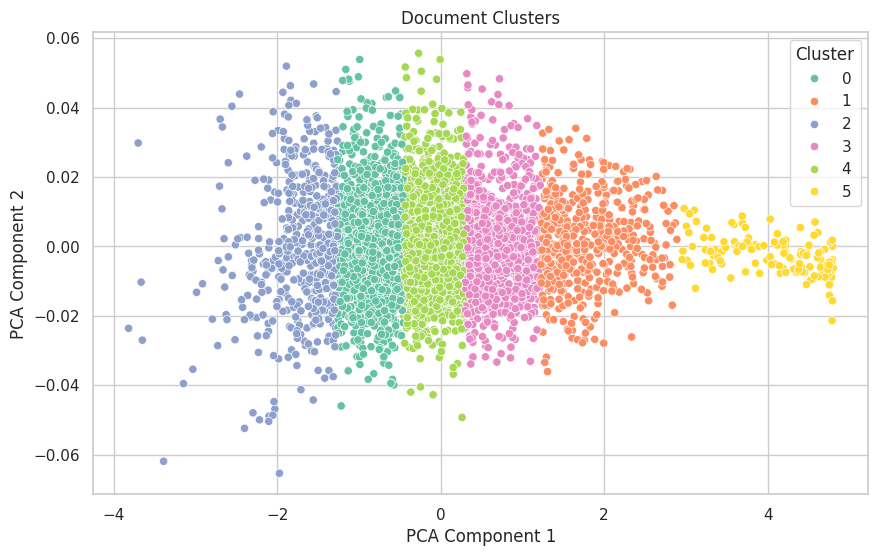

In [45]:
pca = PCA(n_components=2)
reduced_vectors = pca.fit_transform(sentence_vectors)

# Create a scatterplot
plt.figure(figsize=(10, 6))
sns.scatterplot(x=reduced_vectors[:, 0], y=reduced_vectors[:, 1], hue=kmeans.labels_, palette="Set2")
plt.title("Document Clusters")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.legend(title="Cluster")
plt.show()


In [46]:
df_cluster['is_ai'] = df_cluster.apply(lambda row: 'AI' if row['ai_cluster'] == row['cluster'] else 'Human', axis=1)

for cluster in range(num_clusters):
    print(f"\nCluster {cluster}:")
    print(df_cluster[df_cluster['cluster'] == cluster][['sentence', 'is_ai']].head(5))  # Show top 5 sentences with AI/Human label



Cluster 0:
                                             sentence  is_ai
4   It is not like any map I have ever seen, and I...  Human
5   The plan of the above-ground city is traced ca...  Human
6   The map’s real content—the topography it inks ...  Human
9    Some of them curl back on themselves like whips.  Human
13  Coming off some of the tunnels are chambers, i...  Human

Cluster 1:
                                             sentence  is_ai
1                     Perhaps you meant https://link?  Human
10  At junctions, three or four tunnel-streets mig...  Human
22  Room Z. Affordance is specified on the map in ...     AI
24  Scattered around the map are little inked skul...     AI
85  A grim, ritualized production line was establi...     AI

Cluster 2:
                                             sentence  is_ai
3   I have been given it on the condition that I d...  Human
14  The map’s place names traverse a range of cult...  Human
15                                 The Room of Cu

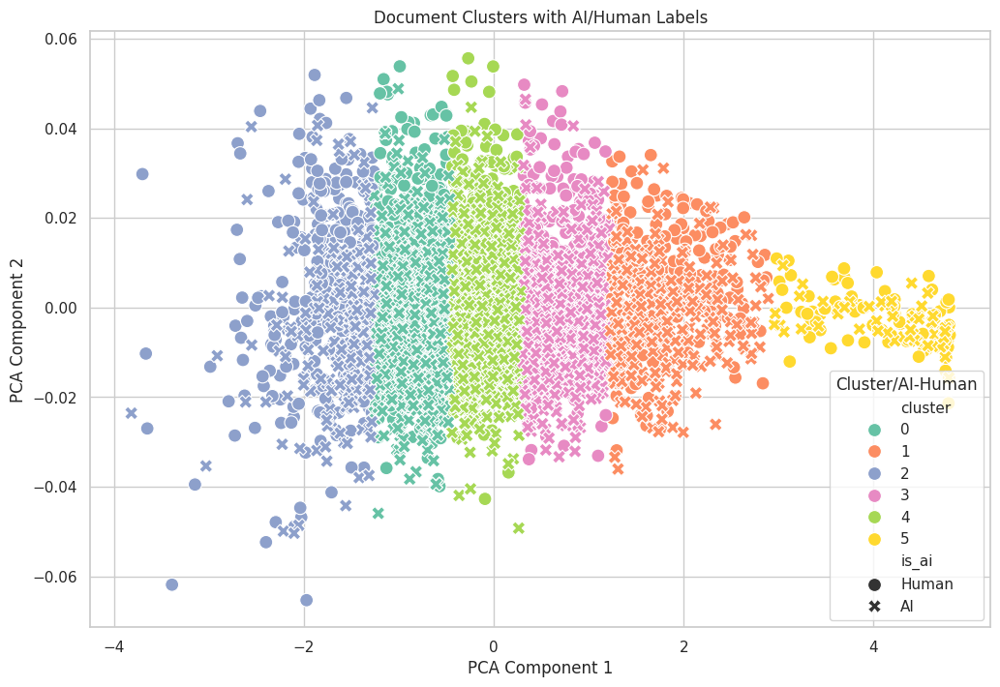

In [47]:
import seaborn as sns

import matplotlib.pyplot as plt

# Reduce the dimensionality of the sentence vectors for visualization
pca = PCA(n_components=2)
reduced_vectors = pca.fit_transform(sentence_vectors)

# Create a DataFrame for visualization
df_vis = pd.DataFrame(reduced_vectors, columns=['PCA1', 'PCA2'])
df_vis['is_ai'] = ['AI' if i >= len(df_cluster) else 'Human' for i in range(len(reduced_vectors))]
df_vis['cluster'] = kmeans.labels_

# Plot the clusters
plt.figure(figsize=(12, 8))
sns.scatterplot(data=df_vis, x='PCA1', y='PCA2', hue='cluster', style='is_ai', palette='Set2', s=100)
plt.title('Document Clusters with AI/Human Labels')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend(title='Cluster/AI-Human')
plt.show()

In [48]:
import plotly.express as px

# Perform PCA to reduce to 3 components for 3D plotting
pca_3d = PCA(n_components=3)
reduced_vectors_3d = pca_3d.fit_transform(sentence_vectors)

# Create a DataFrame for the 3D plot
df_vis_3d = pd.DataFrame(reduced_vectors_3d, columns=['PCA1', 'PCA2', 'PCA3'])
df_vis_3d['is_ai'] = ['AI' if i >= len(df_cluster) else 'Human' for i in range(len(reduced_vectors_3d))]
df_vis_3d['cluster'] = kmeans.labels_

# Create a 3D scatter plot
fig_3d = px.scatter_3d(
    df_vis_3d,
    x='PCA1',
    y='PCA2',
    z='PCA3',
    color='cluster',
    symbol='is_ai',
    title='Document Clusters in 3D'
)

# Update the layout
fig_3d.update_layout(
    scene=dict(
        xaxis_title='PCA1',
        yaxis_title='PCA2',
        zaxis_title='PCA3'
    ),
    width=1000,
    height=1000
)

# Show the plot
fig_3d.show()


## the document cluster was clustered better at seperation but need to check those pairs are on same cluster or not

In [49]:
# Calculate cluster matching statistics
total_pairs = len(df_cluster)
matching_clusters = sum(df_cluster['cluster'] == df_cluster['ai_cluster'])
mismatch_clusters = total_pairs - matching_clusters

# Calculate percentages
matching_percentage = (matching_clusters / total_pairs) * 100
mismatch_percentage = (mismatch_clusters / total_pairs) * 100

# Create detailed statistics for each cluster
cluster_stats = pd.DataFrame({
    'cluster': range(num_clusters),
    'total_human': df_cluster['cluster'].value_counts().sort_index(),
    'total_ai': df_cluster['ai_cluster'].value_counts().sort_index(),
})

# Print results
print(f"Total sentence pairs analyzed: {total_pairs}")
print(f"\nSentences in same cluster: {matching_clusters} ({matching_percentage:.2f}%)")
print(f"Sentences in different clusters: {mismatch_clusters} ({mismatch_percentage:.2f}%)")

print("\nCluster-wise distribution:")
print(cluster_stats)

# Create a pie chart for overall matching vs mismatching
fig = px.pie(
    values=[matching_clusters, mismatch_clusters],
    names=['Same Cluster', 'Different Clusters'],
    title='Distribution of Cluster Matching between Original and AI Sentences'
)
fig.update_layout(
    width=1000,
    height=1000
)
fig.show()


Total sentence pairs analyzed: 2548

Sentences in same cluster: 771 (30.26%)
Sentences in different clusters: 1777 (69.74%)

Cluster-wise distribution:
   cluster  total_human  total_ai
0        0          758       599
1        1          225       271
2        2          376       174
3        3          419       631
4        4          671       822
5        5           99        51


## sentences Are not in Same clusters which should not happened


---
### Now Lets try with T-SNE
---

In [50]:
from sklearn.manifold import TSNE
import numpy as np

# Convert sentence_vectors list to numpy array
sentence_vectors_array = np.array([vector for vector in sentence_vectors])

# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42)
tsne_vectors = tsne.fit_transform(sentence_vectors_array)

# Create a DataFrame for visualization
df_tsne = pd.DataFrame(tsne_vectors, columns=['TSNE1', 'TSNE2'])
df_tsne['is_ai'] = ['AI' if i >= len(df_cluster) else 'Human' for i in range(len(tsne_vectors))]
df_tsne['cluster'] = kmeans.labels_

# Plot using Plotly
fig = px.scatter(
    df_tsne,
    x='TSNE1',
    y='TSNE2', 
    color='cluster',
    symbol='is_ai',
    title='Document Clusters using t-SNE'
)

# Update layout
fig.update_layout(
    title='Document Clusters using t-SNE',
    xaxis_title='t-SNE Component 1',
    yaxis_title='t-SNE Component 2',
    legend_title='Cluster/AI-Human',
    width=1000,
    height=800
)

fig.show()

In [51]:
from sklearn.manifold import TSNE
import numpy as np
import plotly.express as px

# Load and preprocess sentences if not already done
if 'sentence_vectors' not in globals():
    # Combine both columns into a single list for clustering
    all_sentences = df_cluster['sentence'].tolist() + df_cluster['ai_sentence'].tolist()
    
    # Basic preprocessing: tokenize sentences
    all_sentences = [sentence.lower().split() for sentence in all_sentences]
    
    # Train Word2Vec model
    w2v_model = Word2Vec(sentences=all_sentences, vector_size=100, window=5, min_count=1, workers=4)
    
    # Get sentence vectors by averaging word vectors
    sentence_vectors = []
    for sentence in all_sentences:
        sentence_vectors.append(
            sum([w2v_model.wv[word] for word in sentence if word in w2v_model.wv]) / len(sentence)
        )

# Convert sentence_vectors list to numpy array
sentence_vectors_array = np.array([vector for vector in sentence_vectors])

# Apply t-SNE with 3 components
tsne_3d = TSNE(n_components=3, random_state=42)
tsne_vectors_3d = tsne_3d.fit_transform(sentence_vectors_array)

# Create a DataFrame for 3D visualization
df_tsne_3d = pd.DataFrame(tsne_vectors_3d, columns=['TSNE1', 'TSNE2', 'TSNE3'])
df_tsne_3d['is_ai'] = ['AI' if i >= len(df_cluster) else 'Human' for i in range(len(tsne_vectors_3d))]
df_tsne_3d['cluster'] = kmeans.labels_

# Create 3D scatter plot using Plotly
fig = px.scatter_3d(
    df_tsne_3d,
    x='TSNE1',
    y='TSNE2',
    z='TSNE3',
    color='cluster',
    symbol='is_ai',
    title='Document Clusters using t-SNE (3D)'
)

# Update layout
fig.update_layout(
    scene=dict(
        xaxis_title='t-SNE Component 1',
        yaxis_title='t-SNE Component 2',
        zaxis_title='t-SNE Component 3'
    ),
    width=1000,
    height=800
)

fig.show()

Total pairs analyzed: 2548
Pairs in same cluster: 771 (30.26%)
Pairs in different clusters: 1777 (69.74%)


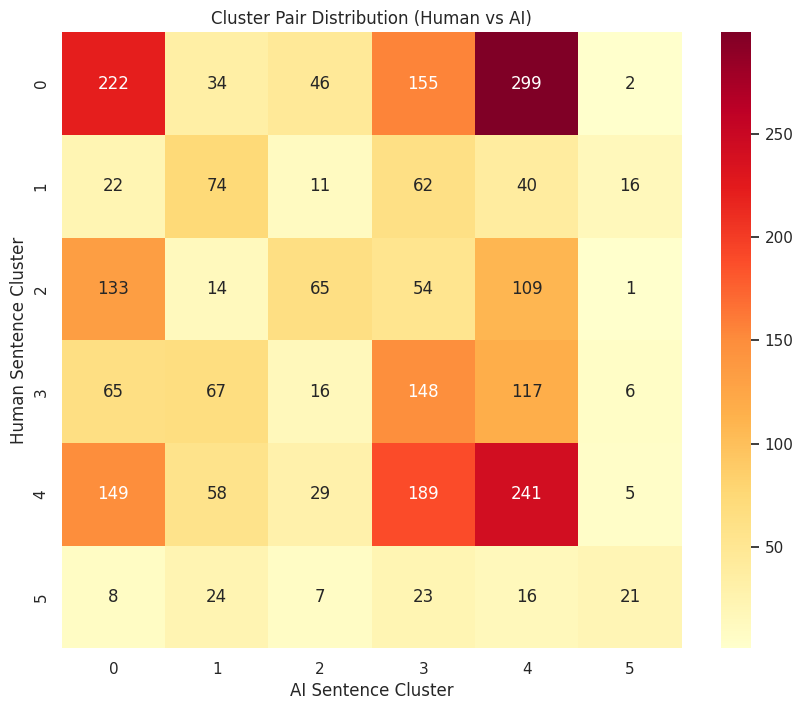

In [52]:
# Create a comparison between sentence pairs and their clusters
comparison_df = pd.DataFrame({
    'human_sentence': df_cluster['sentence'],
    'ai_sentence': df_cluster['ai_sentence'],
    'human_cluster': df_cluster['cluster'],
    'ai_cluster': df_cluster['ai_cluster']
})

# Create a list of matched pairs
comparison_df['same_cluster'] = comparison_df['human_cluster'] == comparison_df['ai_cluster']

# Calculate statistics
matched_pairs = comparison_df['same_cluster'].sum()
total_pairs = len(comparison_df)
match_percentage = (matched_pairs / total_pairs) * 100
mismatch_percentage = 100 - match_percentage

print(f"Total pairs analyzed: {total_pairs}")
print(f"Pairs in same cluster: {matched_pairs} ({match_percentage:.2f}%)")
print(f"Pairs in different clusters: {total_pairs - matched_pairs} ({mismatch_percentage:.2f}%)")

# Create a confusion matrix of clusters
cluster_matrix = pd.crosstab(comparison_df['human_cluster'], comparison_df['ai_cluster'])

# Plot using seaborn heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(cluster_matrix, annot=True, fmt='d', cmap='YlOrRd')
plt.title('Cluster Pair Distribution (Human vs AI)')
plt.xlabel('AI Sentence Cluster')
plt.ylabel('Human Sentence Cluster')
plt.show()

---
# Let's do the stylometric analysis
---

In [53]:
import numpy as np

In [54]:
df_stylo = pd.read_csv('sentences_pairs_original.csv')

## to do the stylometric analysis need to extract the features to get uniqeness of each writing styles

In [55]:
# Function to compute stylometric features
import string

def compute_features(text):
    words = text.split()
    num_words = len(words)
    avg_word_length = np.mean([len(word) for word in words]) if words else 0
    num_unique_words = len(set(words))
    punctuation_count = sum([1 for char in text if char in string.punctuation])
    
    return pd.Series([num_words, avg_word_length, num_unique_words, punctuation_count])

# Apply to both human and AI sentences
df_stylo[['sentence_length', 'avg_word_length', 'unique_words', 'punctuation_count']] = df_stylo['sentence'].apply(compute_features)
df_stylo[['ai_sentence_length', 'ai_avg_word_length', 'ai_unique_words', 'ai_punctuation_count']] = df_stylo['ai_sentence'].apply(compute_features)

# Preview computed features
print(df_stylo.head())


   doc_id  paragraph_id                                           sentence  \
0       1             1     Error: Invalid URL 'link': No scheme supplied.   
1       1             1                    Perhaps you meant https://link?   
2       2             1  The map runs to sixteen laminated foolscap pag...   
3       2             1  I have been given it on the condition that I d...   
4       2             1  It is not like any map I have ever seen, and I...   

                                         ai_sentence  sentence_length  \
0  Alert: The specified URL 'link' is invalid due...              7.0   
1  It is possible that the intended link is: <htt...              4.0   
2  The assemblage of the sixteen laminated foolsc...             19.0   
3  I've received it under the proviso of non-diss...             15.0   
4  This map does not resemble any I've encountere...             20.0   

   avg_word_length  unique_words  punctuation_count  ai_sentence_length  \
0         5.71428

In [56]:
from sklearn.preprocessing import MinMaxScaler
import string

# Function to compute stylometric features
def compute_features(text):
    if not isinstance(text, str):
        return pd.Series([0, 0, 0, 0])  # Return zeros for non-string input
    
    words = text.split()
    num_words = len(words)
    avg_word_length = np.mean([len(word) for word in words]) if words else 0
    num_unique_words = len(set(words))
    punctuation_count = sum([1 for char in text if char in string.punctuation])
    
    return pd.Series([num_words, avg_word_length, num_unique_words, punctuation_count])

# Compute features for both human and AI sentences
df_stylo = df_cluster.copy()
df_stylo[['sentence_length', 'avg_word_length', 'unique_words', 'punctuation_count']] = df_stylo['sentence'].apply(compute_features)
df_stylo[['ai_sentence_length', 'ai_avg_word_length', 'ai_unique_words', 'ai_punctuation_count']] = df_stylo['ai_sentence'].apply(compute_features)

# Features to normalize
features_to_normalize = [
    'sentence_length', 'avg_word_length', 'unique_words', 'punctuation_count',
    'ai_sentence_length', 'ai_avg_word_length', 'ai_unique_words', 'ai_punctuation_count'
]

# Initialize MinMaxScaler and normalize the features
scaler = MinMaxScaler()
df_normalized = df_stylo.copy()
df_normalized[features_to_normalize] = scaler.fit_transform(df_stylo[features_to_normalize])

# Check normalized features
print(df_normalized[features_to_normalize].head())


   sentence_length  avg_word_length  unique_words  punctuation_count  \
0         0.053097         0.048601      0.068182           0.277778   
1         0.026549         0.061856      0.034091           0.222222   
2         0.159292         0.037982      0.204545           0.166667   
3         0.123894         0.023368      0.136364           0.055556   
4         0.168142         0.024227      0.193182           0.111111   

   ai_sentence_length  ai_avg_word_length  ai_unique_words  \
0            0.061905            0.025830         0.138298   
1            0.038095            0.029520         0.085106   
2            0.066667            0.036162         0.148936   
3            0.033333            0.038284         0.074468   
4            0.095238            0.032156         0.202128   

   ai_punctuation_count  
0              0.255814  
1              0.139535  
2              0.023256  
3              0.069767  
4              0.093023  


## Used min max scalr for normalization

In [57]:
# Compute relative differences
df_normalized['length_diff'] = df_normalized['sentence_length'] - df_normalized['ai_sentence_length']
df_normalized['word_length_diff'] = df_normalized['avg_word_length'] - df_normalized['ai_avg_word_length']
df_normalized['unique_words_diff'] = df_normalized['unique_words'] - df_normalized['ai_unique_words']
df_normalized['punctuation_diff'] = df_normalized['punctuation_count'] - df_normalized['ai_punctuation_count']

# Check relative differences
print(df_normalized[['length_diff', 'word_length_diff', 'unique_words_diff', 'punctuation_diff']].head())


   length_diff  word_length_diff  unique_words_diff  punctuation_diff
0    -0.008807          0.022771          -0.070116          0.021964
1    -0.011547          0.032335          -0.051015          0.082687
2     0.092625          0.001819           0.055609          0.143411
3     0.090560         -0.014916           0.061896         -0.014212
4     0.072903         -0.007929          -0.008946          0.018088


In [58]:
from plotly.subplots import make_subplots

import plotly.graph_objects as go
# Create subplots for stylometric features
# Create subplots for comparing features
# Create subplots with 2 rows for bar and line plots
fig = make_subplots(rows=2, cols=1, subplot_titles=('Stylometric Differences (Bar Plot)', 'Stylometric Differences (Line Plot)'))

# Bar plot
fig.add_trace(
    go.Bar(x=['Word Length', 'Sentence Length', 'Unique Words', 'Punctuation'],
           y=[df_normalized['word_length_diff'].mean(),
              df_normalized['length_diff'].mean(),
              df_normalized['unique_words_diff'].mean(),
              df_normalized['punctuation_diff'].mean()],
           name='Average Differences'),
    row=1, col=1
)

# Line plot
fig.add_trace(
    go.Scatter(x=df_normalized.index,
               y=df_normalized['word_length_diff'],
               name='Word Length Diff',
               mode='lines'),
    row=2, col=1
)

fig.add_trace(
    go.Scatter(x=df_normalized.index,
               y=df_normalized['length_diff'],
               name='Sentence Length Diff',
               mode='lines'),
    row=2, col=1
)

fig.add_trace(
    go.Scatter(x=df_normalized.index,
               y=df_normalized['unique_words_diff'],
               name='Unique Words Diff',
               mode='lines'),
    row=2, col=1
)

fig.add_trace(
    go.Scatter(x=df_normalized.index,
               y=df_normalized['punctuation_diff'],
               name='Punctuation Diff',
               mode='lines'),
    row=2, col=1
)

# Update layout
fig.update_layout(height=800, showlegend=True,
                 title_text="Stylometric Differences Between Human and AI Text")

fig.show()

## The differences was explained in documentaion well

In [59]:
# Select features for PCA
features_for_pca = [
    'sentence_length', 'avg_word_length', 'unique_words', 'punctuation_count',
    'ai_sentence_length', 'ai_avg_word_length', 'ai_unique_words', 'ai_punctuation_count'
]

# Apply PCA
pca = PCA(n_components=2)
pca_transformed = pca.fit_transform(df_normalized[features_for_pca])

# Add PCA components to the DataFrame
df_normalized['PCA1'] = pca_transformed[:, 0]
df_normalized['PCA2'] = pca_transformed[:, 1]

# Explained variance
print("Explained variance ratio:", pca.explained_variance_ratio_)


Explained variance ratio: [0.81178739 0.10538837]


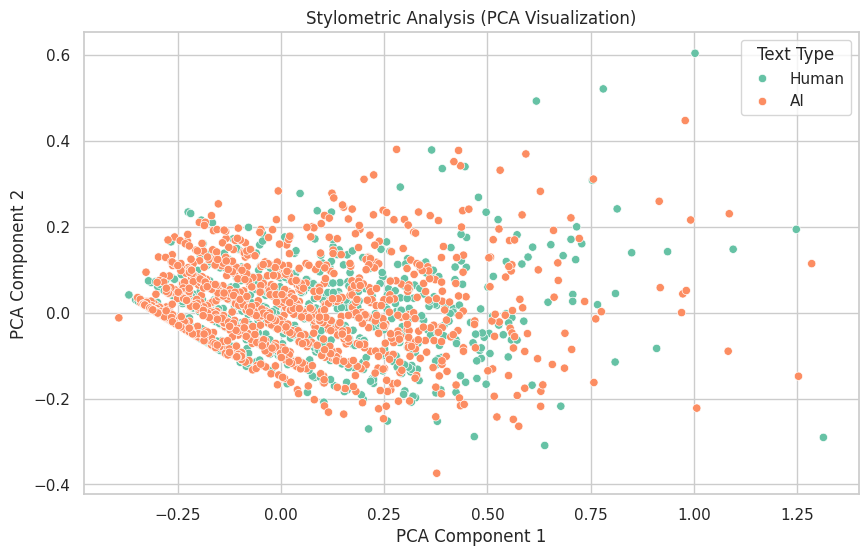

In [60]:
# Create a DataFrame for visualization
df_viz = pd.DataFrame({
    'PCA1': pca_transformed[:, 0],
    'PCA2': pca_transformed[:, 1],
    'Text_Type': ['Human'] * (len(pca_transformed) // 2) + ['AI'] * (len(pca_transformed) // 2)
})

# Plot PCA results
plt.figure(figsize=(10, 6))
sns.scatterplot(
    data=df_viz,
    x='PCA1', 
    y='PCA2', 
    hue='Text_Type',
    palette='Set2'
)
plt.title('Stylometric Analysis (PCA Visualization)')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend(title='Text Type')
plt.show()


## The above example shows that , at some points we cannot identify differently as the wrtiting style of ai and human

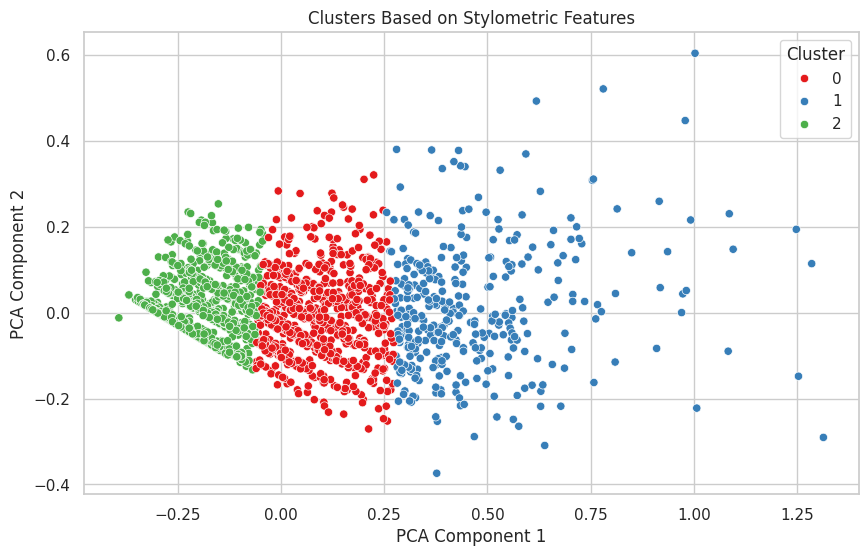

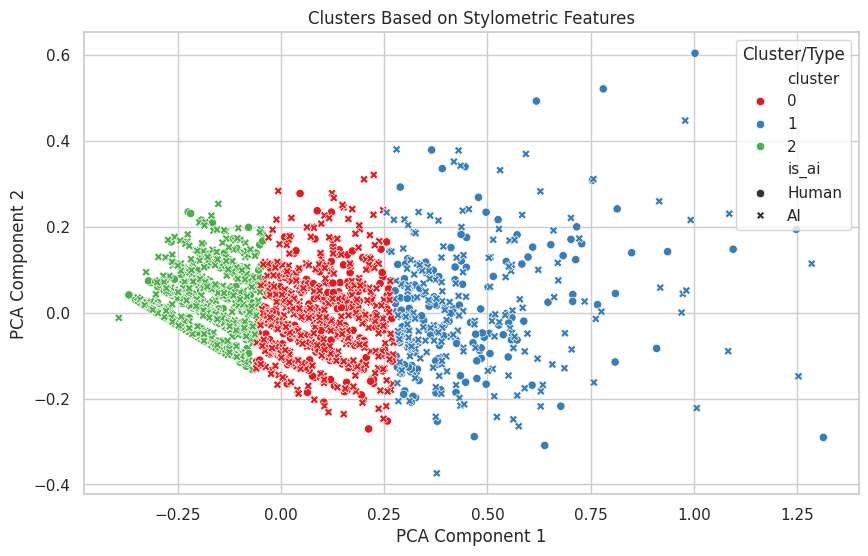


Cluster Matching Statistics:
                     Statistic   Value
0         Total Sentence Pairs    2548
1        Pairs in Same Cluster     519
2  Pairs in Different Clusters    2029
3             Match Percentage  20.37%

Cluster Distribution Matrix:
Empty DataFrame
Columns: []
Index: []


In [61]:
# Apply K-Means clustering
kmeans = KMeans(n_clusters=3, random_state=42)
df_normalized['cluster'] = kmeans.fit_predict(pca_transformed)

# Add 'is_ai' column to df_normalized
df_normalized['is_ai'] = ['AI' if i >= len(df_normalized) // 2 else 'Human' for i in range(len(df_normalized))]

# Visualize clusters
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x=df_normalized['PCA1'], 
    y=df_normalized['PCA2'], 
    hue=df_normalized['cluster'], 
    palette='Set1'
)
plt.title('Clusters Based on Stylometric Features')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend(title='Cluster')
plt.show()

# Visualize clusters with different markers for AI and Human sentences
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x=df_normalized['PCA1'], 
    y=df_normalized['PCA2'], 
    hue=df_normalized['cluster'], 
    style=df_normalized['is_ai'], 
    markers={'Human': 'o', 'AI': 'X'}, 
    palette='Set1'
)
plt.title('Clusters Based on Stylometric Features')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend(title='Cluster/Type')
plt.show()

# Calculate cluster matching statistics
cluster_matches = df_normalized['cluster'] == df_normalized['cluster'].shift(len(df_normalized)//2)
num_matches = cluster_matches.sum()
total_pairs = len(df_normalized) 
match_percentage = (num_matches / total_pairs) * 100

# Create a summary DataFrame
cluster_stats = pd.DataFrame({
    'Statistic': [
        'Total Sentence Pairs',
        'Pairs in Same Cluster', 
        'Pairs in Different Clusters',
        'Match Percentage'
    ],
    'Value': [
        total_pairs,
        num_matches,
        total_pairs - num_matches,
        f'{match_percentage:.2f}%'
    ]
})

print("\nCluster Matching Statistics:")
print(cluster_stats)

# Create a confusion matrix of cluster assignments
confusion_matrix = pd.crosstab(
    df_normalized.iloc[:len(df_normalized)//2]['cluster'],
    df_normalized.iloc[len(df_normalized)//2:]['cluster'],
    margins=True
)

print("\nCluster Distribution Matrix:")
print(confusion_matrix)



In [62]:
import plotly.subplots as sp
import plotly.graph_objects as go

# Create subplot figure
fig = sp.make_subplots(
    rows=3, cols=1,
    subplot_titles=(
        'Cluster Distribution by Type',
        'Sentence Length Statistics',
        'Word Length vs Punctuation',
        'Cluster Matching Matrix'
    )
)

# 1. Add cluster distribution bar chart
# We already have human_dist_values and ai_dist_values



# 2. Add sentence length box plot
fig.add_trace(
    go.Box(y=df_normalized['sentence_length'], name='Human Sentences'),
    row=1, col=1
)
fig.add_trace(
    go.Box(y=df_normalized['ai_sentence_length'], name='AI Sentences'),
    row=1, col=1
)

# 3. Add scatter plot for word length vs punctuation
fig.add_trace(
    go.Scatter(
        x=df_normalized['avg_word_length'],
        y=df_normalized['punctuation_count'],
        mode='markers',
        marker=dict(color=df_normalized['cluster']),
        name='Human'
    ),
    row=2, col=1
)

# 4. Add heatmap for cluster matching matrix
fig.add_trace(
    go.Heatmap(
        z=cluster_matrix.values,
        x=['AI '+str(i) for i in range(6)],
        y=['Human '+str(i) for i in range(6)],
        colorscale='Viridis'
    ),
    row=3, col=1
)

# Update layout
fig.update_layout(
    height=1400,
    width=1200,
    showlegend=True,
    title_text="Comprehensive Analysis of Human vs AI Text",
    barmode='group'
)

# Update axes labels
fig.update_xaxes(title_text="Cluster", row=1, col=1)
fig.update_yaxes(title_text="Count", row=1, col=1)
fig.update_xaxes(title_text="Word Length", row=2, col=1)
fig.update_yaxes(title_text="Punctuation Count", row=2, col=1)

fig.show()


Cluster Profiles (Average values for each feature):
           doc_id  paragraph_id  sentence_length  avg_word_length  \
cluster                                                             
0        4.885463           1.0         0.202877         0.038774   
1        4.901099           1.0         0.378999         0.040248   
2        4.650470           1.0         0.077288         0.040769   

         unique_words  punctuation_count  ai_sentence_length  \
cluster                                                        
0            0.237085           0.214023            0.117600   
1            0.419206           0.409035            0.211251   
2            0.095683           0.110066            0.052071   

         ai_avg_word_length  ai_unique_words  ai_punctuation_count  \
cluster                                                              
0                  0.035265         0.244271              0.103857   
1                  0.033772         0.418079              0.196461   


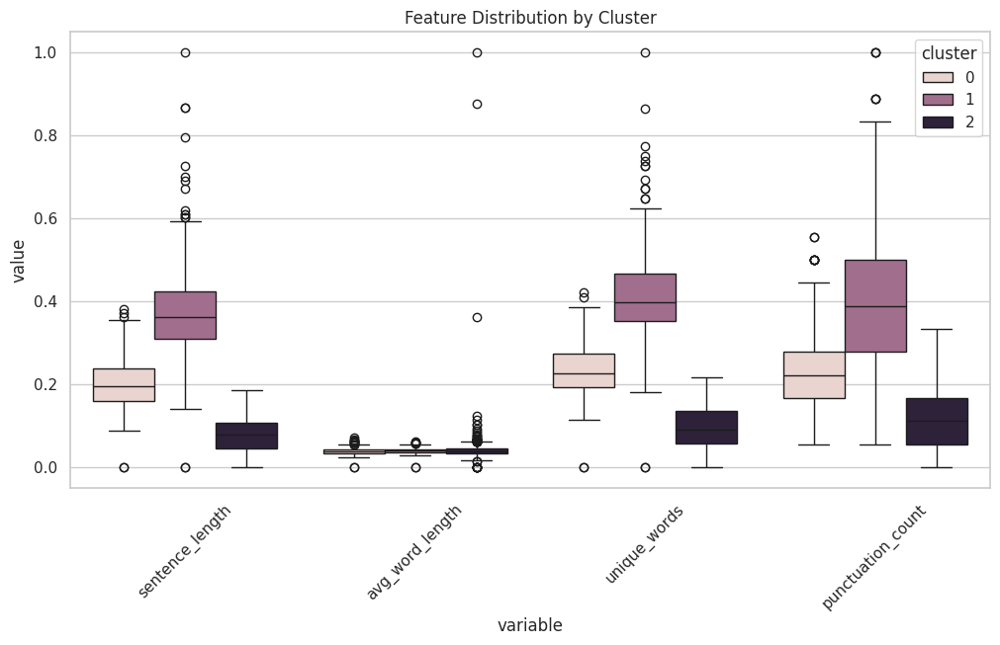


Cluster Composition (% AI vs Human):
   cluster  human_percent  ai_percent
0        2      48.458150   51.541850
1        0      46.703297   53.296703
2        1      52.037618   47.962382


<Figure size 1000x600 with 0 Axes>

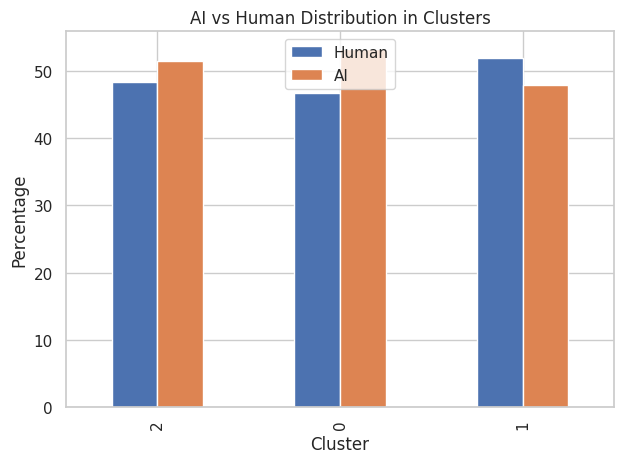

Stylometric Analysis Summary:
                               Metric     Value
0                Total Pairs Analyzed      2548
1                  Same Cluster Pairs       519
2             Different Cluster Pairs      2029
3                    Match Percentage    20.37%
4      Average Word Length Difference  0.004727
5  Average Sentence Length Difference  0.066981
6      Average Punctuation Difference  0.094855


ValueError: zero-size array to reduction operation fmin which has no identity

<Figure size 1000x800 with 0 Axes>

In [63]:
# Get numeric columns only for cluster profiles
numeric_columns = df_normalized.select_dtypes(include=['float64', 'int64']).columns
cluster_profiles = df_normalized.groupby('cluster')[numeric_columns].mean()
print("\nCluster Profiles (Average values for each feature):")
print(cluster_profiles)

# Print additional cluster statistics
print("\nCluster Sizes:")
print(df_normalized['cluster'].value_counts())

# Create cluster visualization with AI/Human labels
plt.figure(figsize=(12, 6))
# Melt the DataFrame and include the cluster column
melted_df = df_normalized.melt(
    value_vars=['sentence_length', 'avg_word_length', 'unique_words', 'punctuation_count'],
    id_vars=['cluster']
)
sns.boxplot(data=melted_df, x='variable', y='value', hue='cluster')
plt.title('Feature Distribution by Cluster')
plt.xticks(rotation=45)
plt.show()

# Calculate percentage of AI/Human sentences in each cluster
cluster_composition = pd.DataFrame({
    'cluster': df_normalized['cluster'].unique()
})

cluster_composition['total_count'] = df_normalized['cluster'].value_counts().sort_index()
cluster_composition['human_count'] = df_normalized.iloc[:len(df_normalized)//2]['cluster'].value_counts().sort_index()
cluster_composition['ai_count'] = df_normalized.iloc[len(df_normalized)//2:]['cluster'].value_counts().sort_index()
cluster_composition['human_percent'] = cluster_composition['human_count'] / cluster_composition['total_count'] * 100
cluster_composition['ai_percent'] = cluster_composition['ai_count'] / cluster_composition['total_count'] * 100

print("\nCluster Composition (% AI vs Human):")
print(cluster_composition[['cluster', 'human_percent', 'ai_percent']])

# Visualize cluster composition
plt.figure(figsize=(10, 6))
cluster_composition.plot(kind='bar', x='cluster', y=['human_percent', 'ai_percent'], 
                        title='AI vs Human Distribution in Clusters')
plt.ylabel('Percentage')
plt.xlabel('Cluster')
plt.legend(['Human', 'AI'])
plt.tight_layout()
plt.show()

# Create a list of examples where human and AI sentences are in same/different clusters
different_pairs = df_normalized[df_normalized['cluster'] != df_normalized['cluster'].shift(len(df_normalized)//2)]
num_different = len(different_pairs)
different_percentage = (num_different / len(df_normalized)) * 100

# Create summary statistics DataFrame
summary_stats = pd.DataFrame({
    'Metric': [
        'Total Pairs Analyzed',
        'Same Cluster Pairs',
        'Different Cluster Pairs',
        'Match Percentage',
        'Average Word Length Difference',
        'Average Sentence Length Difference',
        'Average Punctuation Difference'
    ],
    'Value': [
        len(df_normalized) ,
        len(df_normalized)  - num_different,
        num_different,
        f"{100 - different_percentage:.2f}%",
        df_normalized['word_length_diff'].mean(),
        df_normalized['length_diff'].mean(),
        df_normalized['punctuation_diff'].mean()
    ]
})

print("Stylometric Analysis Summary:")
print(summary_stats)

# Visualize the cluster matching with a heatmap
cluster_match_matrix = pd.crosstab(
    df_normalized.iloc[:len(df_normalized)]['cluster'],
    df_normalized.iloc[len(df_normalized):]['cluster']
)

plt.figure(figsize=(10, 8))
sns.heatmap(cluster_match_matrix, annot=True, fmt='d', cmap='YlOrRd')
plt.title('Cluster Distribution: Human vs AI Sentences')
plt.xlabel('AI Sentence Cluster')
plt.ylabel('Human Sentence Cluster')
plt.show()

In [64]:
for cluster in df_normalized['cluster'].unique():
    print(f"Cluster {cluster} samples:")
    print(df_normalized[df_normalized['cluster'] == cluster]['sentence'].sample(5).values)
    print("\n")


Cluster 2 samples:
['Once, when he was a kid, his dad took him scuba diving with dolphins.'
 'Actually, it was easy enough to pinpoint.'
 '"He knows what you want and is willing to help.'
 'We\'d give new meaning to the term "advocacy journalism."'
 'A faint shudder at first, but clear and now growing in strength and noise.']


Cluster 0 samples:
['Something waits there that might explain, and that must justify, your presence in this absence, this scooped-out plain where no living soul belongs.'
 'Once back in Gustavus, Dave and I realized that we would need to call Jon’s parents in Switzerland.'
 'We paddled through a spitting drizzle in an endless straight line, along the high granite walls of the coast.'
 'Jon, meanwhile, was teaching at a rustic little boarding school in Switzerland, where his mother was from.'
 'When he gets too good at pushing back his coffee with chopsticks, he takes a sphere of water and blows on it, curious to see what wave pattern might result.']


Cluster 1 

### Interpretation of Stylometric Analysis

#### Cluster 0 Samples:
- **Writing Style**: The sentences in Cluster 0 are descriptive and narrative, often providing detailed imagery and context. They tend to be longer and more complex, with a focus on storytelling.
- **Examples**:
    - "Something waits there that might explain, and that must justify, your presence in this absence, this scooped-out plain where no living soul belongs."
    - "We paddled through a spitting drizzle in an endless straight line, along the high granite walls of the coast."

#### Cluster 1 Samples:
- **Writing Style**: The sentences in Cluster 1 are varied, including both short and long sentences. They often contain personal anecdotes or reflections, and some sentences are quite complex with multiple clauses.
- **Examples**:
    - "Baldessari had been involved in hundreds of rescue operations during his 30-year career, and yet, as I stood at the stove on the phone that evening, he told me: “The moment I listened to your voice mail, I knew exactly the case!"
    - "On Sundays, Steves wears his jeans to church, where he plays the congas, with great arm-pumping spirit, in the inspirational soft-rock band that serenades the congregation before the service starts, and then he sits down and sings classic Lutheran hymns without even needing to refer to the hymnal."

#### Cluster 2 Samples:
- **Writing Style**: The sentences in Cluster 2 are generally shorter and more straightforward. They often contain direct statements or observations, and the language is simpler and more concise.
- **Examples**:
    - "Once, when he was a kid, his dad took him scuba diving with dolphins."
    - "Actually, it was easy enough to pinpoint."

### Summary
- **Cluster 0**: Descriptive, narrative, and complex sentences with detailed imagery.
- **Cluster 1**: Varied sentence lengths, personal anecdotes, and reflections with complex structures.
- **Cluster 2**: Short, straightforward, and concise sentences with direct statements.

This analysis helps in understanding the different writing styles present in the text and how they are grouped into clusters based on their stylometric features.

---
---
# Let's do the Topic Modeling
---

In [65]:
df = pd.read_csv("sentences_pairs_original.csv")

# Create a new DataFrame with document-wise grouping
doc_wise_df = pd.DataFrame()
doc_wise_df['text'] = df.groupby('doc_id')['sentence'].agg(lambda x: ' '.join(x))

In [66]:
df = pd.read_csv("sentences_pairs_original.csv")

# Create a new DataFrame with document-wise grouping
doc_wise_df_ai = pd.DataFrame()
doc_wise_df_ai['text'] = df.groupby('doc_id')['ai_sentence'].agg(lambda x: ' '.join(x))

In [67]:
doc_wise_df.head(10)

,text
doc_id,
1,Error: Invalid URL 'link': No scheme supplied....
2,The map runs to sixteen laminated foolscap pag...
3,"Under the whirling vortex of the Milky Way, bi..."
4,"In February 2003, after the explosion of the s..."
5,"ByJON MOOALLEMMARCH 20, 2019 A weeklong trip i..."
6,Originally published in the October 2000 issue...
7,When the ocean liner Andrea Doria sank south o...


[nltk_data] Downloading package stopwords to
[nltk_data]     /home/kasr_ubu/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /home/kasr_ubu/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


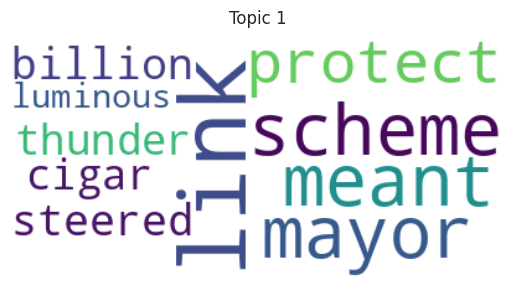

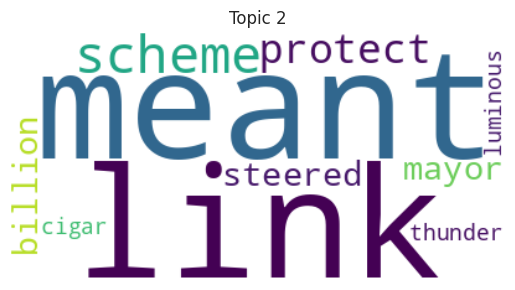

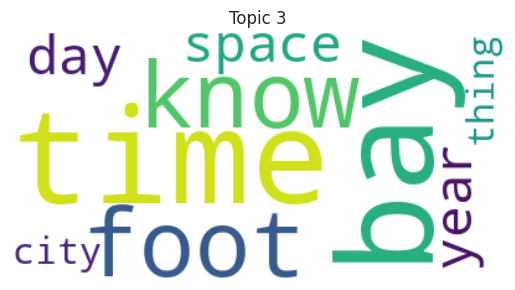

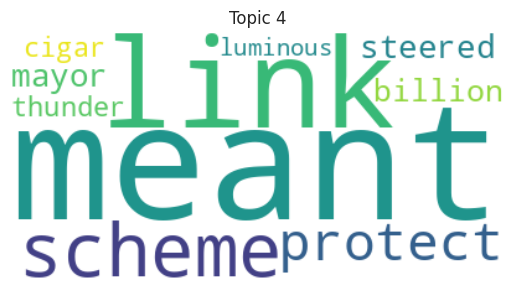

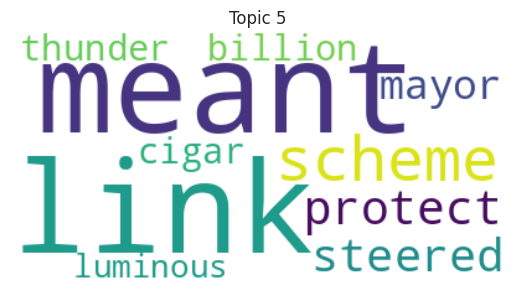

Discovered Topics and Keywords:
Topic 1: link, scheme, meant, mayor, protect, steered, billion, thunder, cigar, luminous
Topic 2: meant, link, scheme, protect, steered, mayor, billion, thunder, cigar, luminous
Topic 3: like, time, bay, foot, know, space, day, year, city, thing
Topic 4: meant, link, scheme, protect, steered, mayor, billion, thunder, cigar, luminous
Topic 5: meant, link, scheme, protect, steered, mayor, billion, thunder, cigar, luminous


In [68]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import re
import nltk
from nltk.corpus import stopwords

nltk.download('stopwords')
nltk.download('punkt')

documents = doc_wise_df['text']  # Replace with your text column

def preprocess(text):
    text = re.sub(r'\W+', ' ', text)  # Remove special characters
    text = text.lower()  # Convert to lowercase
    stop_words = set(stopwords.words('english'))
    text = ' '.join([word for word in text.split() if word not in stop_words])
    lemmatizer = nltk.WordNetLemmatizer()
    text = ' '.join([lemmatizer.lemmatize(word) for word in text.split()])
    return text


# Preprocess Entire Document
processed_documents = documents.apply(preprocess)

# Vectorization
tfidf_vectorizer = TfidfVectorizer(max_df=0.95, min_df=2, stop_words='english')
tfidf_matrix = tfidf_vectorizer.fit_transform(processed_documents)

# LDA Topic Modeling
lda_model = LatentDirichletAllocation(n_components=5, random_state=42)  # Adjust n_components
lda_model.fit(tfidf_matrix)

# Display Topics
def display_topics(model, feature_names, num_top_words):
    topics = {}
    for topic_idx, topic in enumerate(model.components_):
        topics[f"Topic {topic_idx+1}"] = [feature_names[i] for i in topic.argsort()[:-num_top_words - 1:-1]]
    return topics

keywords = display_topics(lda_model, tfidf_vectorizer.get_feature_names_out(), 10)

# Visualize Topics with Word Clouds
for topic, words in keywords.items():
    wordcloud = WordCloud(background_color='white').generate(' '.join(words))
    plt.figure()
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.title(topic)
    plt.show()

# Print Topics
print("Discovered Topics and Keywords:")
for topic, words in keywords.items():
    print(f"{topic}: {', '.join(words)}")


[nltk_data] Downloading package stopwords to
[nltk_data]     /home/kasr_ubu/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /home/kasr_ubu/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


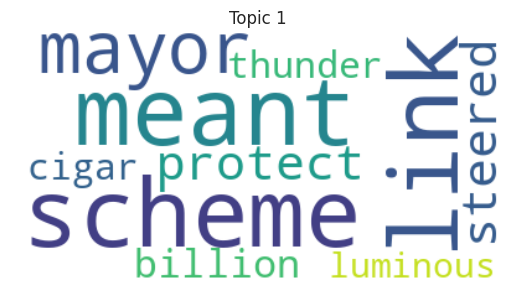

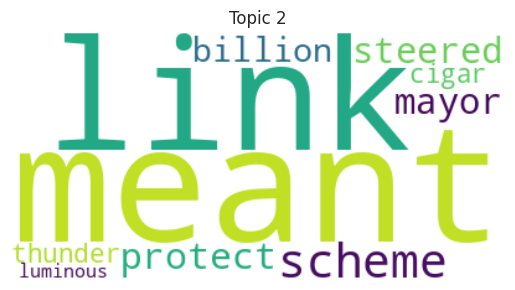

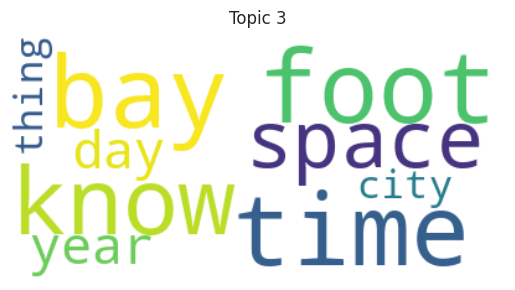

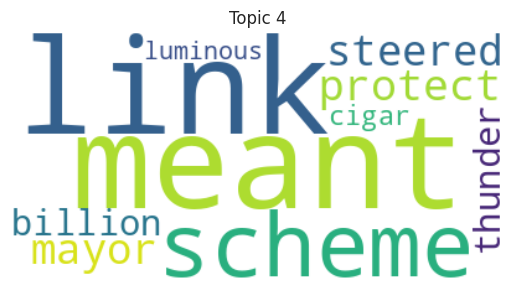

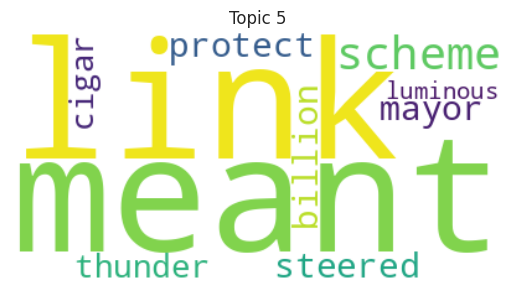

Discovered Topics and Keywords:
Topic 1: link, scheme, meant, mayor, protect, steered, billion, thunder, cigar, luminous
Topic 2: meant, link, scheme, protect, steered, mayor, billion, thunder, cigar, luminous
Topic 3: like, time, bay, foot, know, space, day, year, city, thing
Topic 4: meant, link, scheme, protect, steered, mayor, billion, thunder, cigar, luminous
Topic 5: meant, link, scheme, protect, steered, mayor, billion, thunder, cigar, luminous


In [69]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import re
import nltk
from nltk.corpus import stopwords

nltk.download('stopwords')
nltk.download('punkt')

documents = doc_wise_df['text']  # Replace with your text column

# Preprocessing Function
def preprocess(text):
    text = re.sub(r'\W+', ' ', text)  # Remove special characters
    text = text.lower()  # Convert to lowercase
    stop_words = set(stopwords.words('english'))
    text = ' '.join([word for word in text.split() if word not in stop_words])
    lemmatizer = nltk.WordNetLemmatizer()
    text = ' '.join([lemmatizer.lemmatize(word) for word in text.split()])
    return text

# Preprocess Entire Document
processed_documents = documents.apply(preprocess)

# Vectorization
tfidf_vectorizer = TfidfVectorizer(max_df=0.95, min_df=2, stop_words='english')
tfidf_matrix = tfidf_vectorizer.fit_transform(processed_documents)

# LDA Topic Modeling
lda_model = LatentDirichletAllocation(n_components=5, random_state=42)  # Adjust n_components
lda_model.fit(tfidf_matrix)

# Display Topics
def display_topics(model, feature_names, num_top_words):
    topics = {}
    for topic_idx, topic in enumerate(model.components_):
        topics[f"Topic {topic_idx+1}"] = [feature_names[i] for i in topic.argsort()[:-num_top_words - 1:-1]]
    return topics

keywords = display_topics(lda_model, tfidf_vectorizer.get_feature_names_out(), 10)

# Visualize Topics with Word Clouds
for topic, words in keywords.items():
    wordcloud = WordCloud(background_color='white').generate(' '.join(words))
    plt.figure()
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.title(topic)
    plt.show()

# Print Topics
print("Discovered Topics and Keywords:")
for topic, words in keywords.items():
    print(f"{topic}: {', '.join(words)}")


## this topic modeling method doesnt perform really well , beacause of that I tried the gensim LDA model as well below

In [70]:
import pandas as pd
import gensim
from gensim import corpora
from gensim.models import LdaModel
from gensim.models.coherencemodel import CoherenceModel
import pyLDAvis
import pyLDAvis.gensim_models
import re
from nltk.corpus import stopwords

# Load Dataset
df = pd.read_csv('sentences_pairs_original.csv')

# Preprocess and Tokenize the Content (Document-Wise)
def preprocess(text):
    # Lowercase the text
    
    text = text.lower()
    # Remove special characters and numbers
    text = re.sub(r'\W+', ' ', text)
    text = re.sub(r'\d+', '', text)
    # Split into tokens
    tokens = text.split()
    # Remove stopwords (Optional: Add your stopwords list)
    
    stop_words = set(stopwords.words('english'))
    tokens = [word for word in tokens if word not in stop_words]
    lemmatizer = nltk.WordNetLemmatizer()
    tokens = [lemmatizer.lemmatize(word) for word in tokens]
    return tokens

# Apply preprocessing
df['Content_WordTokenized'] = df['sentence'].apply(preprocess)

# Create Dictionary and Corpus
dictionary = corpora.Dictionary(df['Content_WordTokenized'])
corpus = [dictionary.doc2bow(text) for text in df['Content_WordTokenized']]

# Build LDA Model
num_topics = 6  # Adjust the number of topics as needed
lda_model = LdaModel(corpus, num_topics=num_topics, id2word=dictionary, passes=10, random_state=42)

# Display Topics with Labels
topic_labels = {
    0: '',
    1: '',
    2: '',
    3: '',
    4: '',
    5: ''
}

topics = lda_model.print_topics(num_words=10)
print("Extracted Topics with Labels:")
for idx, topic in topics:
    print(f"Topic {idx} ({topic_labels.get(idx, 'Unknown')}): {topic}")

# Calculate Topic Coherence
coherence_model = CoherenceModel(model=lda_model, texts=df['Content_WordTokenized'], dictionary=dictionary, coherence='c_v')
coherence_score = coherence_model.get_coherence()
print(f"Coherence Score: {coherence_score}")

# Visualize Topics using pyLDAvis
lda_vis = pyLDAvis.gensim_models.prepare(lda_model, corpus, dictionary, mds='tsne')

# Save the visualization as HTML
pyLDAvis.save_html(lda_vis, 'lda_visualization.html')
print("LDA visualization saved as 'lda_visualization.html'.")

#To display the interactive visualization (Optional)
# Uncomment if you want to show the visualization directly in a notebook or server
pyLDAvis.display(lda_vis)


Extracted Topics with Labels:
Topic 0 (): 0.006*"boris" + 0.006*"like" + 0.006*"u" + 0.005*"get" + 0.004*"dragan" + 0.004*"back" + 0.004*"make" + 0.004*"nothing" + 0.004*"would" + 0.003*"jon"
Topic 1 (): 0.009*"know" + 0.008*"like" + 0.006*"one" + 0.006*"go" + 0.006*"would" + 0.006*"dark" + 0.005*"guy" + 0.005*"time" + 0.005*"scuba" + 0.005*"u"
Topic 2 (): 0.006*"ci" + 0.006*"celebi" + 0.005*"part" + 0.005*"would" + 0.005*"karadzic" + 0.005*"diver" + 0.004*"year" + 0.004*"like" + 0.004*"five" + 0.004*"number"
Topic 3 (): 0.009*"one" + 0.009*"steves" + 0.005*"said" + 0.004*"long" + 0.004*"time" + 0.004*"first" + 0.004*"gas" + 0.004*"right" + 0.004*"nitrogen" + 0.004*"jon"
Topic 4 (): 0.012*"boris" + 0.008*"got" + 0.008*"thing" + 0.006*"meeting" + 0.006*"day" + 0.006*"say" + 0.006*"one" + 0.005*"first" + 0.005*"u" + 0.005*"tank"
Topic 5 (): 0.012*"foot" + 0.009*"colonel" + 0.008*"lieutenant" + 0.007*"boat" + 0.007*"feel" + 0.007*"john" + 0.005*"see" + 0.005*"know" + 0.005*"u" + 0.004*"de

In [71]:
import pandas as pd
import gensim
from gensim import corpora
from gensim.models import LdaModel
from gensim.models.coherencemodel import CoherenceModel
import pyLDAvis
import pyLDAvis.gensim_models
import re
from nltk.corpus import stopwords

# Load Dataset
df = pd.read_csv('sentences_pairs_original.csv')

# Preprocess and Tokenize the Content (Document-Wise)
def preprocess(text):
    # Lowercase the text
    
    text = text.lower()
    # Remove special characters and numbers
    text = re.sub(r'\W+', ' ', text)
    text = re.sub(r'\d+', '', text)
    # Split into tokens
    tokens = text.split()
    # Remove stopwords (Optional: Add your stopwords list)
    stop_words = set(stopwords.words('english'))
    tokens = [word for word in tokens if word not in stop_words]
    return tokens

# Apply preprocessing
df['Content_WordTokenized'] = df['ai_sentence'].apply(preprocess)

# Create Dictionary and Corpus
dictionary = corpora.Dictionary(df['Content_WordTokenized'])
corpus = [dictionary.doc2bow(text) for text in df['Content_WordTokenized']]

# Build LDA Model
num_topics = 6  # Adjust the number of topics as needed
lda_model = LdaModel(corpus, num_topics=num_topics, id2word=dictionary, passes=10, random_state=42)

# Display Topics with Labels
# Display Topics with Labels
topic_labels = {
    0: '',
    1: '',
    2: '',
    3: '',
    4: '',
    5: ''
}

topics = lda_model.print_topics(num_words=10)
print("Extracted Topics with Labels:")
for idx, topic in topics:
    print(f"Topic {idx} ({topic_labels.get(idx, 'Unknown')}): {topic}")

# Calculate Topic Coherence
coherence_model = CoherenceModel(model=lda_model, texts=df['Content_WordTokenized'], dictionary=dictionary, coherence='c_v')
coherence_score = coherence_model.get_coherence()
print(f"Coherence Score: {coherence_score}")

# Visualize Topics using pyLDAvis
lda_vis = pyLDAvis.gensim_models.prepare(lda_model, corpus, dictionary, mds='tsne')

# Save the visualization as HTML
pyLDAvis.save_html(lda_vis, 'lda_visualization.html')
print("LDA visualization saved as 'lda_visualization.html'.")

#To display the interactive visualization (Optional)
# Uncomment if you want to show the visualization directly in a notebook or server
pyLDAvis.display(lda_vis)


Extracted Topics with Labels:
Topic 0 (): 0.005*"two" + 0.005*"boris" + 0.004*"dragan" + 0.004*"within" + 0.004*"karadzic" + 0.004*"cia" + 0.003*"harald" + 0.003*"towards" + 0.003*"feet" + 0.003*"impact"
Topic 1 (): 0.007*"within" + 0.005*"upon" + 0.004*"individual" + 0.003*"diving" + 0.003*"however" + 0.003*"one" + 0.003*"days" + 0.003*"paris" + 0.003*"steve" + 0.003*"colonel"
Topic 2 (): 0.008*"boris" + 0.008*"upon" + 0.005*"within" + 0.005*"towards" + 0.004*"us" + 0.004*"feet" + 0.004*"state" + 0.004*"united" + 0.004*"doria" + 0.004*"yet"
Topic 3 (): 0.007*"within" + 0.004*"water" + 0.004*"however" + 0.004*"one" + 0.004*"would" + 0.003*"line" + 0.003*"diver" + 0.003*"old" + 0.003*"upon" + 0.003*"year"
Topic 4 (): 0.010*"sentence" + 0.009*"ai" + 0.007*"entity" + 0.006*"structure" + 0.006*"without" + 0.006*"original" + 0.006*"statement" + 0.006*"within" + 0.005*"artificial" + 0.005*"subsequently"
Topic 5 (): 0.008*"within" + 0.007*"diving" + 0.006*"scuba" + 0.005*"one" + 0.005*"water"

---
---
# Dependency Parsing

----

In [120]:
import spacy
import networkx as nx
import plotly.graph_objects as go

# Load English language model
nlp = spacy.load('en_core_web_sm')

def visualize_doc_dependency(doc_wise_df, doc_index):
    """
    Visualize dependency parse for a specific document in the dataframe.
    
    Parameters:
    doc_wise_df: pandas DataFrame containing 'text' column
    doc_index: int - index of the document to visualize
    """
    # Input validation
    if 'text' not in doc_wise_df.columns:
        raise ValueError("DataFrame must contain a 'text' column")
        
    if doc_index >= len(doc_wise_df):
        raise ValueError(f"Index {doc_index} is out of range. Maximum index is {len(doc_wise_df)-1}")
    
    # Get the document text
    text = doc_wise_df['text'].iloc[doc_index]
    
    # Process the document
    doc = nlp(text)
    
    # Create graph
    graph = nx.DiGraph()
    
    # Add edges for dependencies
    for token in doc:
        if not token.is_punct and not token.is_space:
            # Add nodes with both text and part-of-speech tags
            graph.add_node(f"{token.text}\n({token.pos_})", pos=token.pos_)
            if token.head.text != token.text:  # Avoid self-loops
                graph.add_node(f"{token.head.text}\n({token.head.pos_})", pos=token.head.pos_)
                graph.add_edge(f"{token.head.text}\n({token.head.pos_})", 
                             f"{token.text}\n({token.pos_})", 
                             label=token.dep_)

    # Create network layout
    pos = nx.spring_layout(graph, k=1)

    # Create edge trace
    edge_x = []
    edge_y = []
    edge_texts = []
    for edge in graph.edges():
        x0, y0 = pos[edge[0]]
        x1, y1 = pos[edge[1]]
        edge_x.extend([x0, x1, None])
        edge_y.extend([y0, y1, None])
        edge_texts.append(graph.edges[edge]['label'])

    edge_trace = go.Scatter(
        x=edge_x, y=edge_y,
        line=dict(width=1, color='gray'),
        hoverinfo='none',
        mode='lines')

    # Create node trace
    node_x = []
    node_y = []
    node_text = []
    for node in graph.nodes():
        x, y = pos[node]
        node_x.append(x)
        node_y.append(y)
        node_text.append(node)

    node_trace = go.Scatter(
        x=node_x, y=node_y,
        mode='markers+text',
        hoverinfo='text',
        text=node_text,
        textposition="top center",
        marker=dict(
            color='lightblue',
            size=30,
            line=dict(width=2)
        ))

    # Create figure
    fig = go.Figure(data=[edge_trace, node_trace],
                   layout=go.Layout(
                       title=dict(text=f'Document {doc_index} Dependency Parse', x=0.5),
                       showlegend=False,
                       hovermode='closest',
                       margin=dict(b=20,l=5,r=5,t=40),
                       xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                       yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))
                   )
    
    # Print the text being analyzed
    print(f"\nAnalyzing document {doc_index}:")
    print(f"Text: {text[:200]}..." if len(text) > 200 else f"Text: {text}")
    
    fig.show()

# Example usage:
# To visualize different documents, just change the index
try:
    # Show first document
    visualize_doc_dependency(doc_wise_df, 2)
    

except Exception as e:
    print(f"Error: {str(e)}")


Analyzing document 2:
Text: Under the whirling vortex of the Milky Way, billions and billions of tiny enzyme bombs blew up against our ship. We blasted back with a volley of photon torpedoes--shoom! shoom!--that wriggled away at...


## tried to do with document wise , but it really cant interpret how , and waht happened

In [144]:
import spacy
import networkx as nx
import plotly.graph_objects as go
import random
# Load English language model
nlp = spacy.load('en_core_web_sm')

def visualize_doc_dependency(df, doc_index):
    """
    Visualize dependency parse for a specific document in the dataframe.
    
    Parameters:
    doc_wise_df: pandas DataFrame containing 'text' column
    doc_index: int - index of the document to visualize
    """
    # Input validation
    if 'sentence' not in df.columns:
        raise ValueError("DataFrame must contain a 'text' column")

    
    # Get the document text
    text = df['sentence'].iloc[doc_index]
    
    # Process the document
    doc = nlp(text)
    
    # Create graph
    graph = nx.DiGraph()
    
    # Add edges for dependencies
    for token in doc:
        if not token.is_punct and not token.is_space:
            # Add nodes with both text and part-of-speech tags
            graph.add_node(f"{token.text}\n({token.pos_})", pos=token.pos_)
            if token.head.text != token.text:  # Avoid self-loops
                graph.add_node(f"{token.head.text}\n({token.head.pos_})", pos=token.head.pos_)
                graph.add_edge(f"{token.head.text}\n({token.head.pos_})", 
                             f"{token.text}\n({token.pos_})", 
                             label=token.dep_)

    # Create network layout
    pos = nx.spring_layout(graph, k=1)

    # Create edge trace
    edge_x = []
    edge_y = []
    edge_texts = []
    for edge in graph.edges():
        x0, y0 = pos[edge[0]]
        x1, y1 = pos[edge[1]]
        edge_x.extend([x0, x1, None])
        edge_y.extend([y0, y1, None])
        edge_texts.append(graph.edges[edge]['label'])

    edge_trace = go.Scatter(
        x=edge_x, y=edge_y,
        line=dict(width=1, color='gray'),
        hoverinfo='none',
        mode='lines')

    # Create node trace
    node_x = []
    node_y = []
    node_text = []
    for node in graph.nodes():
        x, y = pos[node]
        node_x.append(x)
        node_y.append(y)
        node_text.append(node)

    node_trace = go.Scatter(
        x=node_x, y=node_y,
        mode='markers+text',
        hoverinfo='text',
        text=node_text,
        textposition="top center",
        marker=dict(
            color='lightblue',
            size=30,
            line=dict(width=2)
        ))

    # Create figure
    fig = go.Figure(data=[edge_trace, node_trace],
                   layout=go.Layout(
                       title=dict(text=f'Document {doc_index} Dependency Parse', x=0.5),
                       showlegend=False,
                       hovermode='closest',
                       margin=dict(b=20,l=5,r=5,t=40),
                       xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                       yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))
                   )
    
    # Print the text being analyzed
    print(f"\nAnalyzing document {doc_index}:")
    print(f"Text: {text[:200]}..." if len(text) > 200 else f"Text: {text}")
    
    fig.show()

# Example usage:
# To visualize different documents, just change the index
try:
    random.seed(42)  # Set random seed for reproducibility
    num_docs = len(df)
    for i in random.sample(range(num_docs), 4):
        visualize_doc_dependency(df, i)
    visualize_doc_dependency(df, 8)

except Exception as e:
    print(f"Error: {str(e)}")


Analyzing document 456:
Text: Nowadays, these messages are almost always saved, because she never knows when they might become all she has left.



Analyzing document 102:
Text: Chatrooms and Web sites enabled cataphiles to share and curate information about the network.



Analyzing document 1126:
Text: This was supposed to be the simple part, when everyone rushed him to the hospital.



Analyzing document 1003:
Text: Back in the woods,kneeling over Jon, I was having the same problem: I didn’t know what to say.



Analyzing document 8:
Text: Its tunnelled streets often kink and wriggle, or run to dead ends.


In [143]:
import spacy
import networkx as nx
import random
import plotly.graph_objects as go

# Load English language model
nlp = spacy.load('en_core_web_sm')

def visualize_doc_dependency(df, doc_index):
    """
    Visualize dependency parse for a specific document in the dataframe.
    
    Parameters:
    doc_wise_df: pandas DataFrame containing 'text' column
    doc_index: int - index of the document to visualize
    """
    # Input validation
    if 'ai_sentence' not in df.columns:
        raise ValueError("DataFrame must contain a 'text' column")
        

    # Get the document text
    text = df['ai_sentence'].iloc[doc_index]
    
    # Process the document
    doc = nlp(text)
    
    # Create graph
    graph = nx.DiGraph()
    
    # Add edges for dependencies
    for token in doc:
        if not token.is_punct and not token.is_space:
            # Add nodes with both text and part-of-speech tags
            graph.add_node(f"{token.text}\n({token.pos_})", pos=token.pos_)
            if token.head.text != token.text:  # Avoid self-loops
                graph.add_node(f"{token.head.text}\n({token.head.pos_})", pos=token.head.pos_)
                graph.add_edge(f"{token.head.text}\n({token.head.pos_})", 
                             f"{token.text}\n({token.pos_})", 
                             label=token.dep_)

    # Create network layout
    pos = nx.spring_layout(graph, k=1)

    # Create edge trace
    edge_x = []
    edge_y = []
    edge_texts = []
    for edge in graph.edges():
        x0, y0 = pos[edge[0]]
        x1, y1 = pos[edge[1]]
        edge_x.extend([x0, x1, None])
        edge_y.extend([y0, y1, None])
        edge_texts.append(graph.edges[edge]['label'])

    edge_trace = go.Scatter(
        x=edge_x, y=edge_y,
        line=dict(width=1, color='gray'),
        hoverinfo='none',
        mode='lines')

    # Create node trace
    node_x = []
    node_y = []
    node_text = []
    for node in graph.nodes():
        x, y = pos[node]
        node_x.append(x)
        node_y.append(y)
        node_text.append(node)

    node_trace = go.Scatter(
        x=node_x, y=node_y,
        mode='markers+text',
        hoverinfo='text',
        text=node_text,
        textposition="top center",
        marker=dict(
            color='lightblue',
            size=30,
            line=dict(width=2)
        ))

    # Create figure
    fig = go.Figure(data=[edge_trace, node_trace],
                   layout=go.Layout(
                       title=dict(text=f'Document {doc_index} Dependency Parse', x=0.5),
                       showlegend=False,
                       hovermode='closest',
                       margin=dict(b=20,l=5,r=5,t=40),
                       xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                       yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))
                   )
    
    # Print the text being analyzed
    print(f"\nAnalyzing document {doc_index}:")
    print(f"Text: {text[:200]}..." if len(text) > 200 else f"Text: {text}")
    
    fig.show()

# Example usage:
# To visualize different documents, just change the index
try:
    # Show first document
    # Randomly select 5 documents to visualize
    random.seed(42) 
    num_docs = len(df)
    for i in random.sample(range(num_docs), 4):
        visualize_doc_dependency(df, i)
    visualize_doc_dependency(df, 8)
    

except Exception as e:
    print(f"Error: {str(e)}")


Analyzing document 456:
Text: Currently, such messages are seldom discarded, as she often remains uncertain when they may constitute her only remaining possessions.



Analyzing document 102:
Text: Digital platforms such as chatrooms and websites facilitated the dissemination and preservation of knowledge on the urban catacombs among cataphiles.



Analyzing document 1126:
Text: In this scenario, it was anticipated that this section would prove straightforward; however, upon everyone's urging, he was expedited to the medical facility instead.



Analyzing document 1003:
Text: In the forest's depth, while attending to Jon, the dilemma persisted: I remained unsure of the appropriate words to utter.



Analyzing document 8:
Text: The intricate network of its passageways frequently bends and twists, or leads to cul-de-sacs.


In [119]:
import pandas as pd
from collections import Counter
import spacy

import plotly.express as px
import plotly.graph_objects as go

# Load spaCy model if not already loaded
nlp = spacy.load('en_core_web_sm')

def analyze_sentence_structure(df, column_name):
    """Analyze sentence structure and return metrics"""
    metrics = []
    for text in df[column_name]:
        doc = nlp(str(text))
        
        # Calculate metrics
        num_tokens = len(doc)
        num_verbs = len([token for token in doc if token.pos_ == "VERB"])
        num_nouns = len([token for token in doc if token.pos_ == "NOUN"])
        avg_token_length = sum(len(token.text) for token in doc) / num_tokens if num_tokens > 0 else 0
        
        metrics.append({
            'num_tokens': num_tokens,
            'num_verbs': num_verbs,
            'num_nouns': num_nouns,
            'avg_token_length': avg_token_length,
            'sentence_length': len(text)
        })
    
    return pd.DataFrame(metrics)

def create_comparative_visualization(human_metrics, ai_metrics):
    """Create comparative visualizations of sentence metrics"""
    # Calculate averages
    human_avg = human_metrics.mean()
    ai_avg = ai_metrics.mean()
    
    # Create comparison figure
    fig = go.Figure(data=[
        go.Bar(name='Human Text', 
               x=list(human_avg.index), 
               y=list(human_avg.values)),
        go.Bar(name='AI Text', 
               x=list(ai_avg.index), 
               y=list(ai_avg.values))
    ])
    
    fig.update_layout(
        title='Comparison of Human vs AI Text Metrics',
        barmode='group',
        xaxis_title='Metrics',
        yaxis_title='Average Value'
    )
    
    return fig

# Analyze both human and AI sentences
human_metrics = analyze_sentence_structure(df, 'sentence')
ai_metrics = analyze_sentence_structure(df, 'ai_sentence')

# Create and display visualization
fig = create_comparative_visualization(human_metrics, ai_metrics)
fig.show()

# Calculate and display statistical summary
summary_stats = pd.DataFrame({
    'Human_Mean': human_metrics.mean(),
    'AI_Mean': ai_metrics.mean(),
    'Human_Std': human_metrics.std(),
    'AI_Std': ai_metrics.std(),
    'Difference': ((ai_metrics.mean() - human_metrics.mean()) / human_metrics.mean() * 100)
})

print("\nStatistical Summary:")
print(summary_stats)

# Additional analysis of dependency relations
def analyze_dependency_patterns(df, column_name):
    dependency_patterns = []
    for text in df[column_name].head(100):  # Analyze first 100 sentences for efficiency
        doc = nlp(str(text))
        for token in doc:
            if token.dep_ != "punct":
                dependency_patterns.append(token.dep_)
    
    return Counter(dependency_patterns)

# Compare dependency patterns
human_deps = analyze_dependency_patterns(df, 'sentence')
ai_deps = analyze_dependency_patterns(df, 'ai_sentence')

# Create visualization for dependency patterns
dep_comparison = pd.DataFrame({
    'Human': pd.Series(human_deps),
    'AI': pd.Series(ai_deps)
}).fillna(0)

fig_deps = px.scatter(
    dep_comparison.reset_index(),
    x='Human',
    y='AI',
    text='index',
    title='Dependency Relations: Human vs AI Text'
)

fig_deps.update_traces(textposition='top center')
fig_deps.update_layout(
    xaxis_title='Frequency in Human Text',
    yaxis_title='Frequency in AI Text'
)

fig_deps.show()


Statistical Summary:
                  Human_Mean     AI_Mean  Human_Std     AI_Std  Difference
num_tokens         23.715463   25.866954  15.954474  16.402403    9.072104
num_verbs           2.677786    3.019623   2.088770   2.308638   12.765646
num_nouns           4.133438    5.353611   3.529150   3.777186   29.519559
avg_token_length    3.914791    4.815722   1.103716   1.098995   23.013502
sentence_length   112.732732  144.885008  79.715126  96.485406   28.520799
